# Adipocyte analysis of DCM global heart object
## Analysis date 20210308

In [1]:
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
#import bbknn
import seaborn as sns
#import scgen
import harmonypy as hm
#import scrublet as scr
#from venn import venn
#from venn import pseudovenn
from scipy.stats.mstats import gmean
import matplotlib.pyplot as plt

pd.set_option('max_columns', 50)
pd.set_option('precision', 2)

sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=120, color_map='viridis')
sc.logging.print_versions()

scanpy==1.4.6 anndata==0.7.3 umap==0.4.4 numpy==1.18.1 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.1 statsmodels==0.11.1 python-igraph==0.8.2 louvain==0.7.0


In [2]:
def DEG_table(adata):
    result = adata.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    markers = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})
    return markers

In [3]:
def filtered_DEGs(adata, q_value = 1E-5, fold_change = 1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (abs(markers.loc[:,i+'_l']) >= fold_change)].loc[:,(i+'_n'):(i+'_l')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [4]:
def filtered_down_reg_DEGs(adata, q_value = 1E-5, fold_change = -1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (markers.loc[:,i+'_l'] <= fold_change)].loc[:,(i+'_n'):(i+'_l')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [5]:
def filtered_DEG_names(adata, q_value = 1E-5, fold_change = 1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (abs(markers.loc[:,i+'_l']) >= fold_change)].loc[:,(i+'_n')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [6]:
def filtered_down_reg_DEG_names(adata, q_value = 1E-5, fold_change = -1):
    markers = DEG_table(adata)
    groups = adata.uns['rank_genes_groups']['names'].dtype.names
    output = pd.DataFrame()
    for i in groups:
        temp = markers[(markers.loc[:,i+'_p'] <= q_value) & (markers.loc[:,i+'_l'] <= fold_change)].loc[:,(i+'_n')]
        temp.reset_index(inplace=True, drop=True)
        output = output.join(temp, how='outer')
    return output

In [7]:
def cleanNaNs(d, keep_empty=False):
    clean = {k:{x for x in d[k] if x==x} for k in d.keys()}
    
    if keep_empty == False: 
        for k in list(clean.keys()): 
            if len(clean[k]) < 1: 
                del clean[k]
    return clean

## Funtions from Eric

In [8]:
def correlation_analysis(scanpy_object, column_tosplitby, sum_or_mean):
    d = {}
    for cluster_number in np.unique(scanpy_object.obs[column_tosplitby].values):
        #cluster_number=np.unique(heart.obs['louvain_annotated'].values)[1]
        scanpy_object_subset = scanpy_object[scanpy_object.obs[column_tosplitby].isin([cluster_number])]

        if sum_or_mean=="mean":
            d[cluster_number] = np.squeeze(np.asarray(scanpy_object_subset.raw.X.mean(axis=0))) #np.log(+1)
        elif sum_or_mean=="sum":
            d[cluster_number] = np.squeeze(np.asarray(scanpy_object_subset.raw.X.sum(axis=0))) #np.log(+1)
        del scanpy_object_subset
        
    return d

In [9]:
def stacked_barplot(adata, xaxis, stack, xaxis_label, legend_label, shift_top=0.2, xaxis_rotation=45, figsize=(10,10), percent=True):
    tmp=pd.crosstab(adata.obs[xaxis],
                adata.obs[stack]).sum(axis=1)
    
    ax= pd.crosstab(adata.obs[xaxis], 
                    adata.obs[stack]).apply(lambda r: r/r.sum()*100, axis=1)
    #ax_1 = ax.plot.bar(figsize=(10,10),stacked=True, rot=0, colors=colors)
    ax_1 = ax.plot.bar(figsize=figsize,stacked=True, rot=0)
    #display(ax)
    #plt.legend(title="Subject") # loc='upper center', bbox_to_anchor=(0.1, 1.0), 
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_label)
    plt.xlabel(xaxis_label,fontweight="bold")
    plt.ylabel('Percent Distribution',fontweight="bold")
    
    if percent:
        for rec in ax_1.patches:
            height = rec.get_height()
            ax_1.text(rec.get_x() + rec.get_width() / 2, rec.get_y() + height/2, "{:.0f}%".format(height),
                   ha = 'center', va='center', fontsize=14.5, weight='bold') #
    
    for xaxistick in range(ax.shape[0]):
        ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45, fontsize=14.5, weight='bold')
    
    plt.xticks(rotation=xaxis_rotation, ha = 'right')
    
    ax_1.grid(False)
    plt.show()

In [10]:
# adata_obj should be your Anndata object. sc.tl.rank_genes_groups needs to be run first!
# DE_column the column you performed your DE test on, e.g. leiden or Gene.

def filter_by_expression(adata_obj, DE_column, key='rank_genes_groups'):
#adata_obj=fbs_new_harmony.copy()
#key='rank_genes_groups'
#DE_column='leiden'
    def to_tensor(dataframe, columns = [], dtypes = {}, index = False):
        to_records_kwargs = {'index': index}
        if not columns:  # Default to all `dataframe.columns`
            columns = dataframe.columns
        if dtypes:       # Pull in modifications only for dtypes listed in `columns`
            to_records_kwargs['column_dtypes'] = {}
            for column in dtypes.keys():
                if column in columns:
                    to_records_kwargs['column_dtypes'].update({column: dtypes.get(column)})
        return dataframe[columns].to_records(**to_records_kwargs)
    
    gene_names = pd.DataFrame(adata_obj.uns[key]['names'])
    fraction_in_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    fraction_notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    in_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    notin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allin_cluster_expr_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )
    allnotin_cluster_matrix = pd.DataFrame(
                np.zeros(gene_names.shape),
                columns=gene_names.columns,
                index=gene_names.index,
            )

    for cluster_number in fraction_in_cluster_matrix.columns:
        dummy=adata_obj.raw[:, adata_obj.uns['rank_genes_groups']['names'][cluster_number].tolist()]
        dummy.obs=adata_obj.obs
        subset_cluster=dummy[dummy.obs[DE_column].isin([cluster_number])]
        subset_notin_cluster=dummy[np.logical_not(dummy.obs[DE_column].isin([cluster_number]))]
    
        # Percent of cluster expressing
        if subset_cluster.X.shape[0] != 0:
            total_incluster=subset_cluster.X.shape[0]
        else: 
            total_incluster=np.nan

        if subset_notin_cluster.X.shape[0] != 0:
            total_outcluster=subset_notin_cluster.X.shape[0]
        else: 
            total_outcluster=np.nan
        
        fraction_in_cluster_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].count_nonzero()/total_incluster) for gene_toanalyze in fraction_in_cluster_matrix.index]
        fraction_notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].count_nonzero()/total_outcluster) for gene_toanalyze in fraction_notin_cluster_matrix.index]

        # Expression level (only by expressed)
        in_cluster_expr_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze][subset_cluster.X[:,gene_toanalyze].nonzero()].mean()) for gene_toanalyze in in_cluster_expr_matrix.index]
        notin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze][subset_notin_cluster.X[:,gene_toanalyze].nonzero()].mean()) for gene_toanalyze in notin_cluster_matrix.index]
    
        # Expression_all in cluster
        allin_cluster_expr_matrix[cluster_number]=[(subset_cluster.X[:,gene_toanalyze].mean()) for gene_toanalyze in allin_cluster_expr_matrix.index]
        allnotin_cluster_matrix[cluster_number]=[(subset_notin_cluster.X[:,gene_toanalyze].mean()) for gene_toanalyze in allnotin_cluster_matrix.index]

    # Generate the last table results
    result = adata_obj.uns['rank_genes_groups']
    groups = result['names'].dtype.names
    result['pi'] = to_tensor(fraction_in_cluster_matrix)
    result['po'] = to_tensor(fraction_notin_cluster_matrix)
    result['ei'] = to_tensor(allin_cluster_expr_matrix)
    result['eo'] = to_tensor(allnotin_cluster_matrix)
    
    results =pd.DataFrame(
        {group + '_' + key[:2]: result[key][group]
        for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges', 'pi', 'po', "ei", "eo"]})

    return results


## Read in data

In [11]:
adata_orig = sc.read_h5ad('AD_20210305_V1_RAW.h5ad')

In [12]:
pd.crosstab(adata_orig.obs.Patient, adata_orig.obs.Diagnosis)

Diagnosis,ARVC,Control,DCM,RCM/LVNC
Patient,,,,
BS_H15,0,44,0,0
BS_H20,0,115,0,0
BS_H25,0,19,0,0
BS_H26,0,206,0,0
BS_H35,0,121,0,0
...,...,...,...,...
H80,0,0,8,0
H84,0,0,0,13
IC_H02,0,0,8,0


In [13]:
adata_orig.obs.columns

Index(['Patient', 'Sample', 'Gender', 'Gene', 'Diagnosis',
       'Clinical.dominant.mutation', 'Age', 'Mutation.Type',
       'Genomic.location', 'Region', 'Origin', 'n_genes', 'percent_mito',
       'percent_ribo', 'X10X_version', 'n_counts', 'solo_score',
       'predicted_doublets_solo', 'scrublet_score_z', 'predicted_doublets_z',
       'scrublet_score_log', 'predicted_doublets_log', 'Replicate',
       'cell_states_20200602', 'cell_type_20200602', 'cell_type_20200921',
       'cell_type_global_HCA', 'cell_states_HCA', 'cell_type_fine_20200921',
       'cell_states_20200921', 'cell_states_long_20200921',
       'cell_states_20210218', 'validated_20210218', 'leiden_01', 'leiden_02',
       'leiden_03', 'leiden_04', 'cell_type'],
      dtype='object')

In [14]:
adata_orig.obs

,Patient,Sample,Gender,Gene,Diagnosis,Clinical.dominant.mutation,Age,Mutation.Type,Genomic.location,Region,Origin,n_genes,percent_mito,percent_ribo,X10X_version,n_counts,solo_score,predicted_doublets_solo,scrublet_score_z,predicted_doublets_z,scrublet_score_log,predicted_doublets_log,Replicate,cell_states_20200602,cell_type_20200602,cell_type_20200921,cell_type_global_HCA,cell_states_HCA,cell_type_fine_20200921,cell_states_20200921,cell_states_long_20200921,cell_states_20210218,validated_20210218,leiden_01,leiden_02,leiden_03,leiden_04,cell_type
Barcode,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ATCGCCTAGCTCTTCC-BS_DP2_RV_premrna,DP2,BS_DP2_RV0_premrna,f,PLN,DCM,PLN,44.0,Missense,chr6:+:118558946,RV,HTx,2659,1.90e-03,2.92e-04,V3,6842.0,3.25e-02,False,0.03,False,8.20e-03,False,unique,Adip1A_disease_canonical,AD,AD,nan,Not in HCA,AD,AD1.2,AD1.2_disease_canonical,AD1.1,TRUE,9,10,12,14,AD
CGTAGTATCCTAAGTG-BS_DP2_RV_premrna,DP2,BS_DP2_RV0_premrna,f,PLN,DCM,PLN,44.0,Missense,chr6:+:118558946,RV,HTx,2882,2.89e-04,1.30e-03,V3,6929.0,3.63e-02,False,0.03,False,9.07e-03,False,unique,Adip1A_disease_canonical,AD,AD,nan,Not in HCA,AD,AD1.2,AD1.2_disease_canonical,AD1.1,TRUE,9,10,12,14,AD
GGGTTATCATCACCAA-BS_DP2_RV_premrna,DP2,BS_DP2_RV0_premrna,f,PLN,DCM,PLN,44.0,Missense,chr6:+:118558946,RV,HTx,2042,5.01e-04,1.00e-03,V3,3990.0,2.67e-02,False,0.05,False,1.87e-03,False,unique,Adip2_stromal-like,AD,AD,nan,Not in HCA,AD,AD2,AD2_stromal,AD2,TRUE,9,10,12,14,AD
GTAAGTCTCGACACCG-BS_DP2_RV_premrna,DP2,BS_DP2_RV0_premrna,f,PLN,DCM,PLN,44.0,Missense,chr6:+:118558946,RV,HTx,1983,1.39e-03,7.94e-04,V3,5037.0,1.75e-02,False,0.03,False,6.30e-03,False,unique,Adip1A_disease_canonical,AD,AD,nan,Not in HCA,AD,AD1.2,AD1.2_disease_canonical,AD1.1,TRUE,9,10,12,14,AD
GTCGTTCGTGGCCCAT-BS_DP2_RV_premrna,DP2,BS_DP2_RV0_premrna,f,PLN,DCM,PLN,44.0,Missense,chr6:+:118558946,RV,HTx,1418,0.00e+00,3.91e-04,V3,2556.0,1.25e-02,False,0.04,False,2.07e-03,False,unique,Adip1_canonical,AD,AD,nan,Not in HCA,AD,AD1.2,AD1.2_disease_canonical,AD1.1,TRUE,9,10,12,14,AD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGAATGCGTTACGTAC-IC_H04_RV0_premrna,IC_H04,IC_H04_RV0_premrna,f,mutation negative,DCM,mutation negative,63.0,nan,nan,RV,HTx,815,0.00e+00,0.00e+00,V3,1414.0,1.13e-02,False,0.02,False,4.92e-03,False,unique,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,9,10,12,14,AD
TGCTGAATCCAAGAGG-IC_H04_RV0_premrna,IC_H04,IC_H04_RV0_premrna,f,mutation negative,DCM,mutation negative,63.0,nan,nan,RV,HTx,439,0.00e+00,3.78e-03,V3,529.0,2.70e-03,False,0.01,False,8.49e-04,False,unique,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,9,10,12,14,AD
TGGGAGAAGCGTGAGT-IC_H04_RV0_premrna,IC_H04,IC_H04_RV0_premrna,f,mutation negative,DCM,mutation negative,63.0,nan,nan,RV,HTx,691,2.96e-03,9.85e-04,V3,1015.0,5.77e-03,False,0.02,False,8.98e-03,False,unique,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,9,10,12,14,AD


In [15]:
pd.crosstab(adata_orig.obs.cell_type, adata_orig.obs.Diagnosis)

Diagnosis,ARVC,Control,DCM,RCM/LVNC
cell_type,,,,
AD,593,1123,1046,13


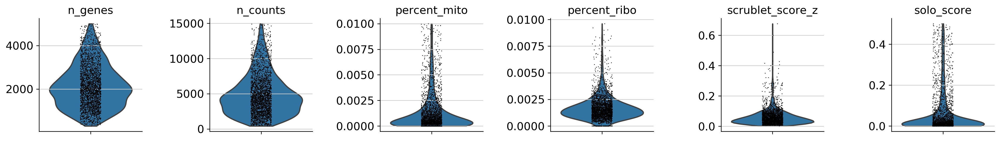

In [16]:
sc.pl.violin(adata_orig, ['n_genes', 'n_counts', 'percent_mito','percent_ribo', 'scrublet_score_z','solo_score'],
             jitter=0.1, multi_panel=True)

In [19]:
adata_orig.X.max()

4660.0

## Normalise and log transform

In [20]:
adata = adata_orig.copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata.copy()

In [21]:
sc.pp.highly_variable_genes(adata, flavor = 'seurat'
                            #, n_top_genes = 10000
                           )
adata_hvg = adata[:, adata.var['highly_variable']]
#adata_hvg = adata

In [22]:
#sc.pp.scale(adata_hvg, max_value=10)

In [23]:
sc.tl.pca(adata_hvg, svd_solver = 'arpack', random_state = 1718)

In [24]:
pca = adata_hvg.obsm['X_pca']
batch = adata_hvg.obs['Patient']
meta_data = adata_hvg.obs

ho = hm.run_harmony(pca, meta_data, ['Patient'
                                    # ,'10X_version'
                                    ], random_state=1718, epsilon_harmony = -float('Inf'), max_iter_kmeans = 10, tau=5)

res = pd.DataFrame(ho.Z_corr)
res=res.T
adata_hvg.obsm['X_pca'] = res.values


sc.pp.neighbors(adata_hvg, 
                random_state=1718)

2021-03-08 10:46:24,225 - harmonypy - INFO - Iteration 1 of 10
2021-03-08 10:46:25,075 - harmonypy - INFO - Iteration 2 of 10
2021-03-08 10:46:25,934 - harmonypy - INFO - Iteration 3 of 10
2021-03-08 10:46:26,762 - harmonypy - INFO - Iteration 4 of 10
2021-03-08 10:46:27,761 - harmonypy - INFO - Iteration 5 of 10
2021-03-08 10:46:28,655 - harmonypy - INFO - Iteration 6 of 10
2021-03-08 10:46:29,606 - harmonypy - INFO - Iteration 7 of 10
2021-03-08 10:46:30,438 - harmonypy - INFO - Iteration 8 of 10
2021-03-08 10:46:31,263 - harmonypy - INFO - Iteration 9 of 10
2021-03-08 10:46:31,906 - harmonypy - INFO - Iteration 10 of 10
2021-03-08 10:46:32,529 - harmonypy - INFO - Stopped before convergence
/home/mlee/anaconda3/envs/scanpy1.4.6_harmony/lib/python3.6/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['d

/home/mlee/anaconda3/envs/scanpy1.4.6_harmony/lib/python3.6/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'].tocoo(),


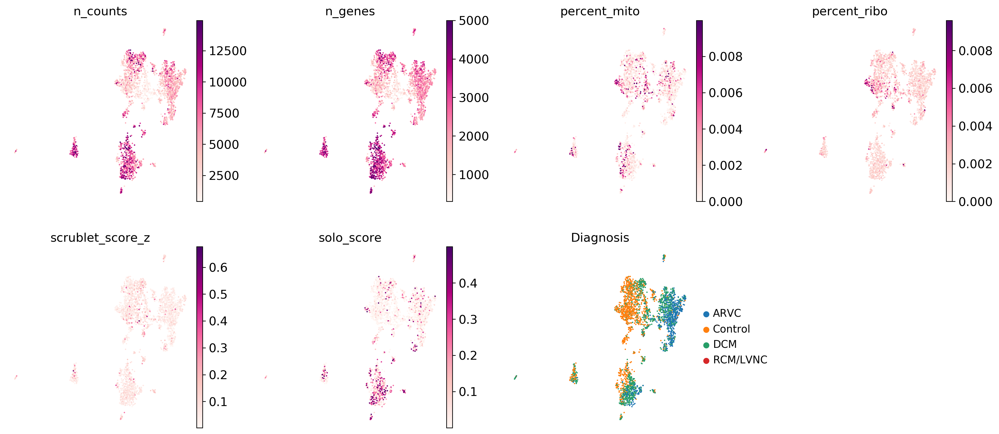

In [25]:
sc.tl.umap(adata_hvg, min_dist = 0.5, spread = 1, random_state = 1718)
sc.pl.umap(adata_hvg, color = ['n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'scrublet_score_z', 'solo_score','Diagnosis'], size = 10, legend_fontsize = 12, frameon = False, color_map='RdPu'
           , save='_QC_-_AD_20210305_V1.pdf'
          )

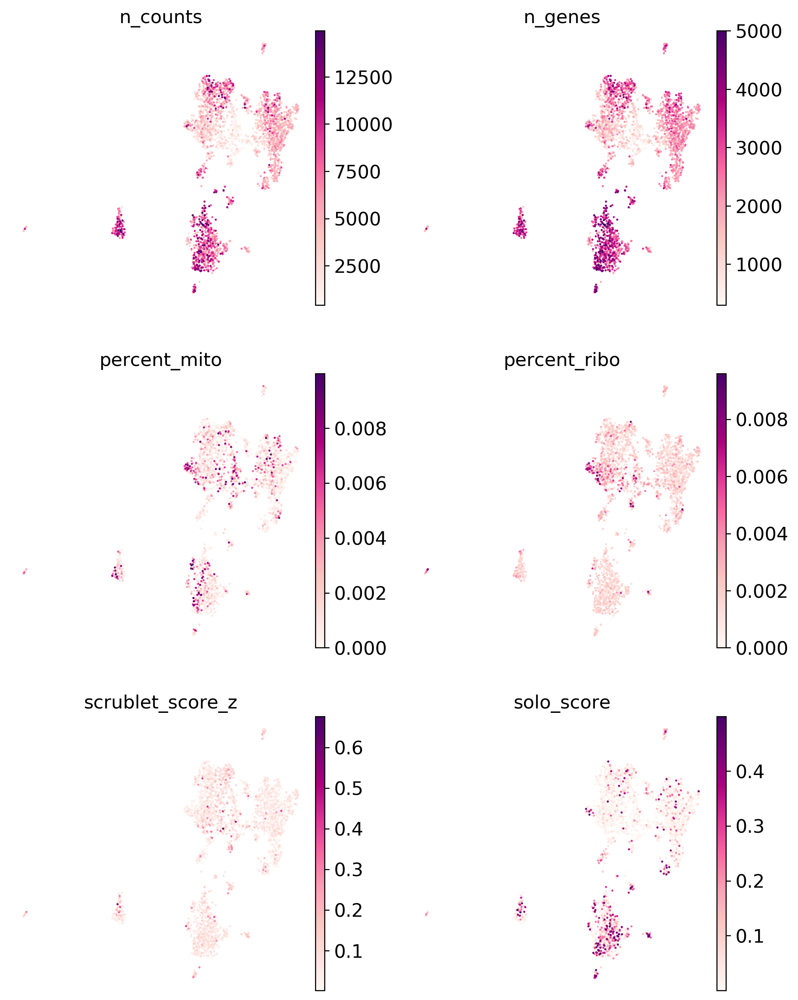

In [26]:
sc.pl.umap(adata_hvg, color = ['n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'scrublet_score_z', 'solo_score'], size = 10, legend_fontsize = 12, frameon = False, color_map='RdPu', ncols=2)

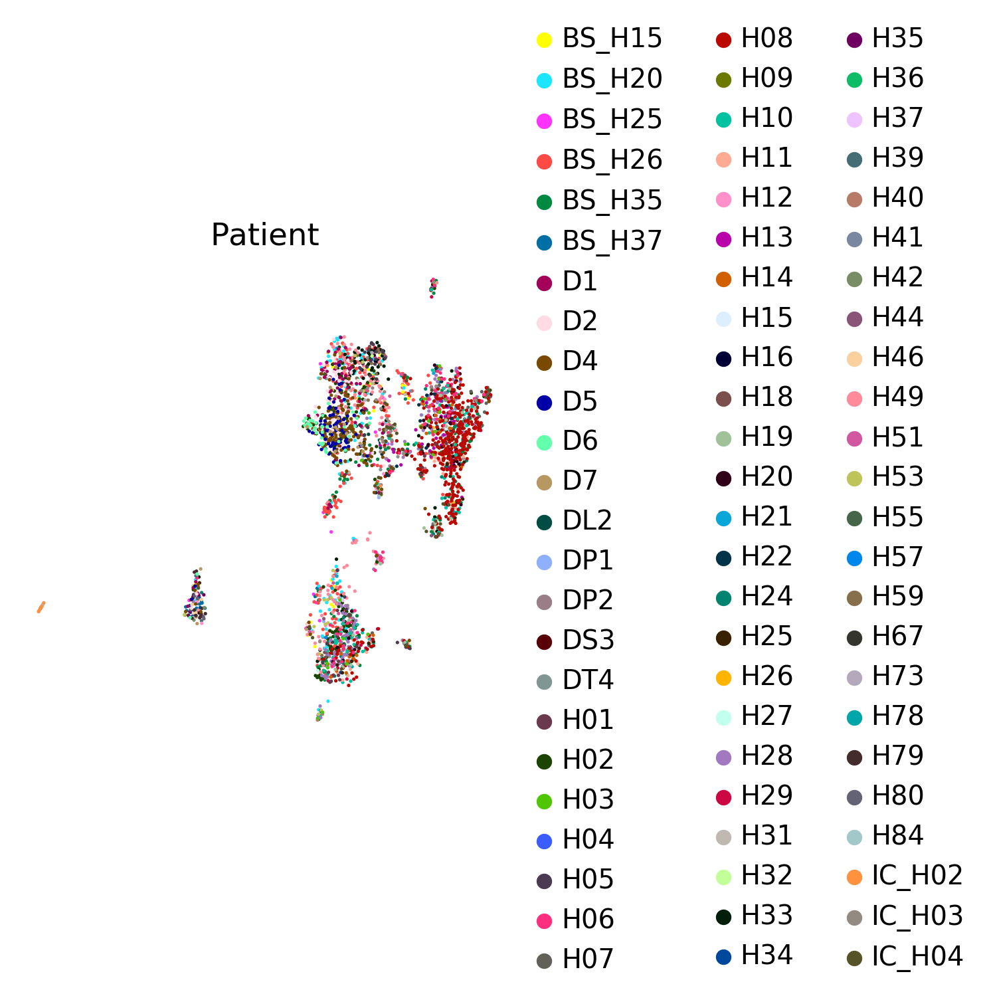

In [27]:
sc.pl.umap(adata_hvg, color = ['Patient'], size = 10, legend_fontsize = 12, frameon = False
                     , save='_Patient_-_AD_20210305_V1.pdf'
)

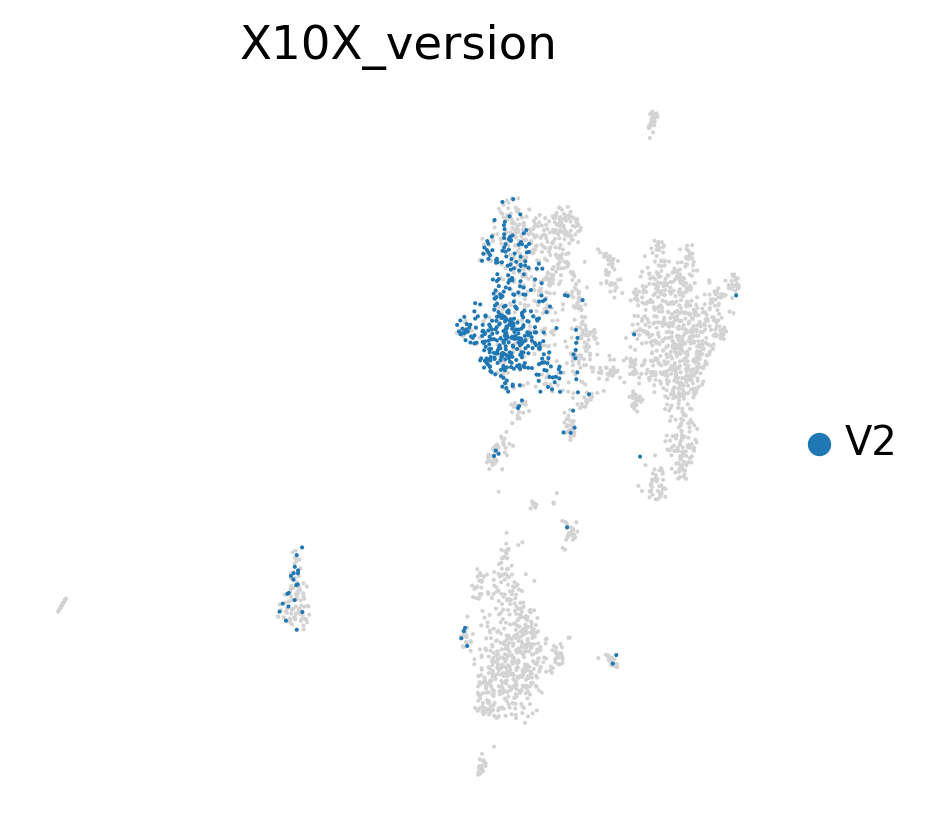

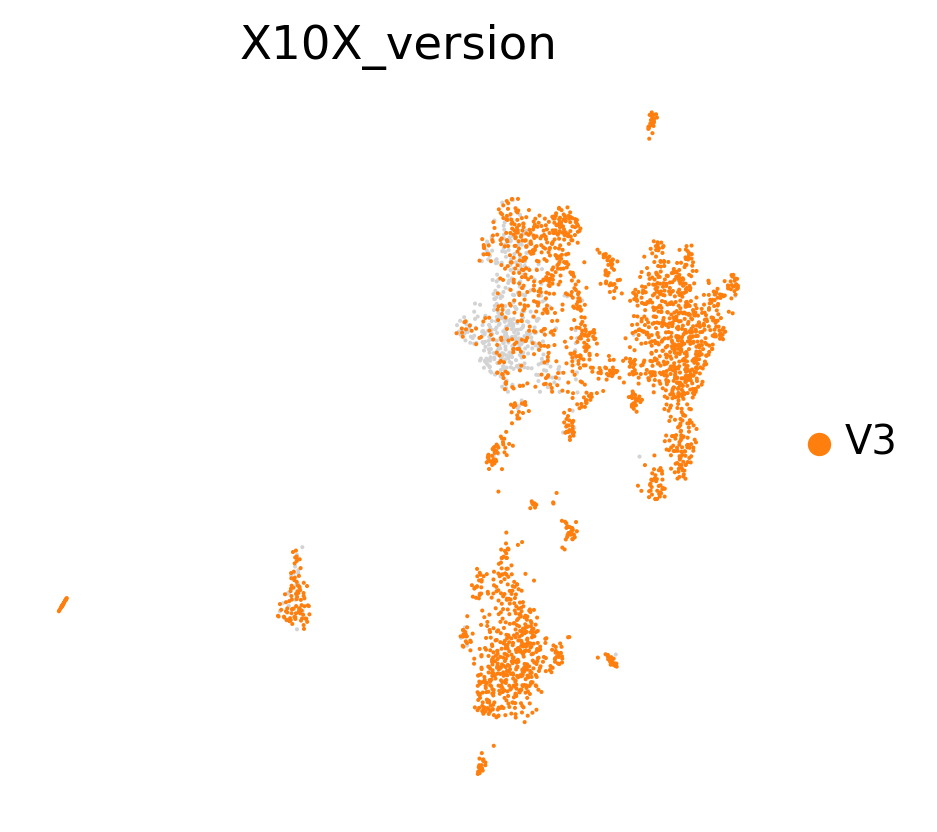

In [28]:
sc.pl.umap(adata_hvg, color = ['X10X_version'],groups=['V2'], size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu')
sc.pl.umap(adata_hvg, color = ['X10X_version'],groups=['V3'], size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu')

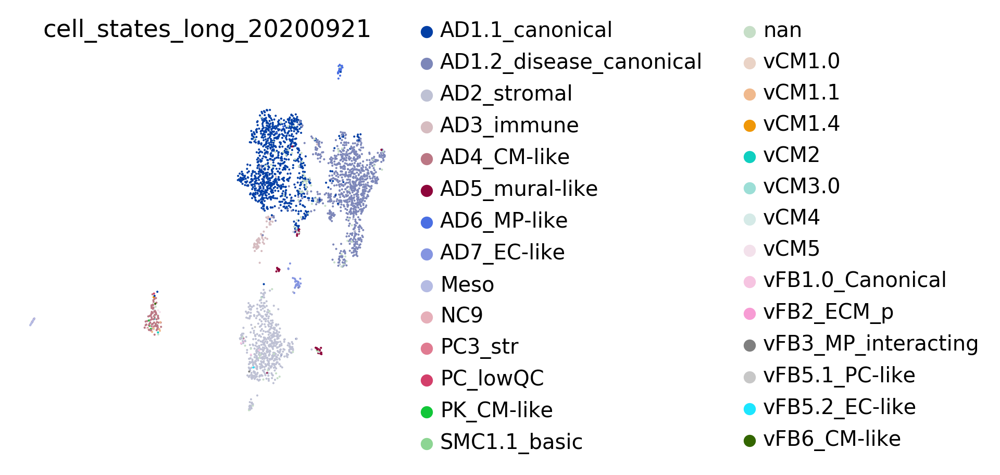

In [31]:
sc.pl.umap(adata_hvg, color = ['cell_states_long_20200921'],size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu')

In [29]:
sc.tl.leiden(adata_hvg, resolution = 0.1, random_state = 1786, key_added = 'leiden_01')
sc.tl.leiden(adata_hvg, resolution = 0.11, random_state = 1786, key_added = 'leiden_011')
sc.tl.leiden(adata_hvg, resolution = 0.12, random_state = 1786, key_added = 'leiden_012')
sc.tl.leiden(adata_hvg, resolution = 0.13, random_state = 1786, key_added = 'leiden_013')
sc.tl.leiden(adata_hvg, resolution = 0.14, random_state = 1786, key_added = 'leiden_014')
sc.tl.leiden(adata_hvg, resolution = 0.15, random_state = 1786, key_added = 'leiden_015')
sc.tl.leiden(adata_hvg, resolution = 0.16, random_state = 1786, key_added = 'leiden_016')
sc.tl.leiden(adata_hvg, resolution = 0.17, random_state = 1786, key_added = 'leiden_017')
sc.tl.leiden(adata_hvg, resolution = 0.18, random_state = 1786, key_added = 'leiden_018')
sc.tl.leiden(adata_hvg, resolution = 0.19, random_state = 1786, key_added = 'leiden_019')

sc.tl.leiden(adata_hvg, resolution = 0.2, random_state = 1786, key_added = 'leiden_02')
sc.tl.leiden(adata_hvg, resolution = 0.21, random_state = 1786, key_added = 'leiden_021')
sc.tl.leiden(adata_hvg, resolution = 0.22, random_state = 1786, key_added = 'leiden_022')
sc.tl.leiden(adata_hvg, resolution = 0.23, random_state = 1786, key_added = 'leiden_023')
sc.tl.leiden(adata_hvg, resolution = 0.24, random_state = 1786, key_added = 'leiden_024')
sc.tl.leiden(adata_hvg, resolution = 0.25, random_state = 1786, key_added = 'leiden_025')
sc.tl.leiden(adata_hvg, resolution = 0.26, random_state = 1786, key_added = 'leiden_026')
sc.tl.leiden(adata_hvg, resolution = 0.27, random_state = 1786, key_added = 'leiden_027')
sc.tl.leiden(adata_hvg, resolution = 0.28, random_state = 1786, key_added = 'leiden_028')
sc.tl.leiden(adata_hvg, resolution = 0.29, random_state = 1786, key_added = 'leiden_029')

sc.tl.leiden(adata_hvg, resolution = 0.3, random_state = 1786, key_added = 'leiden_03')
sc.tl.leiden(adata_hvg, resolution = 0.31, random_state = 1786, key_added = 'leiden_031')
sc.tl.leiden(adata_hvg, resolution = 0.32, random_state = 1786, key_added = 'leiden_032')
sc.tl.leiden(adata_hvg, resolution = 0.33, random_state = 1786, key_added = 'leiden_033')
sc.tl.leiden(adata_hvg, resolution = 0.34, random_state = 1786, key_added = 'leiden_034')
sc.tl.leiden(adata_hvg, resolution = 0.35, random_state = 1786, key_added = 'leiden_035')
sc.tl.leiden(adata_hvg, resolution = 0.36, random_state = 1786, key_added = 'leiden_036')
sc.tl.leiden(adata_hvg, resolution = 0.37, random_state = 1786, key_added = 'leiden_037')
sc.tl.leiden(adata_hvg, resolution = 0.38, random_state = 1786, key_added = 'leiden_038')
sc.tl.leiden(adata_hvg, resolution = 0.39, random_state = 1786, key_added = 'leiden_039')

/home/mlee/anaconda3/envs/scanpy1.4.6_harmony/lib/python3.6/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']
/home/mlee/anaconda3/envs/scanpy1.4.6_harmony/lib/python3.6/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']
/home/mlee/anaconda3/envs/scanpy1.4.6_harmony/lib/python3.6/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']
/home/mlee

/home/mlee/anaconda3/envs/scanpy1.4.6_harmony/lib/python3.6/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']
/home/mlee/anaconda3/envs/scanpy1.4.6_harmony/lib/python3.6/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']
/home/mlee/anaconda3/envs/scanpy1.4.6_harmony/lib/python3.6/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']
/home/mlee

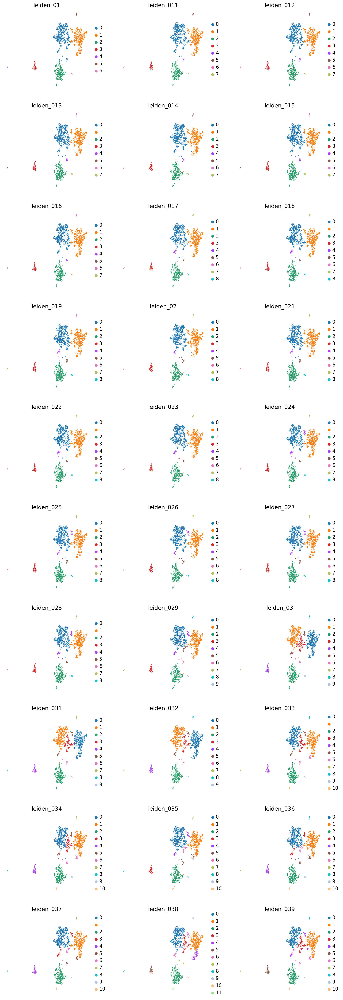

In [30]:
sc.pl.umap(adata_hvg, color = ['leiden_01', 'leiden_011','leiden_012','leiden_013','leiden_014','leiden_015','leiden_016','leiden_017','leiden_018','leiden_019',
                               'leiden_02', 'leiden_021','leiden_022','leiden_023','leiden_024','leiden_025','leiden_026','leiden_027','leiden_028','leiden_029',
                               'leiden_03', 'leiden_031','leiden_032','leiden_033','leiden_034','leiden_035','leiden_036','leiden_037','leiden_038','leiden_039']
           , size = 6, legend_fontsize = 12, frameon = False, ncols=3)

In [32]:
#adata_hvg.obs['leiden'] = adata_hvg.obs.leiden_027 
adata_hvg.obs['leiden'] = adata_hvg.obs.leiden_017
#adata_hvg.obs['leiden'] = adata_hvg.obs.leiden_033

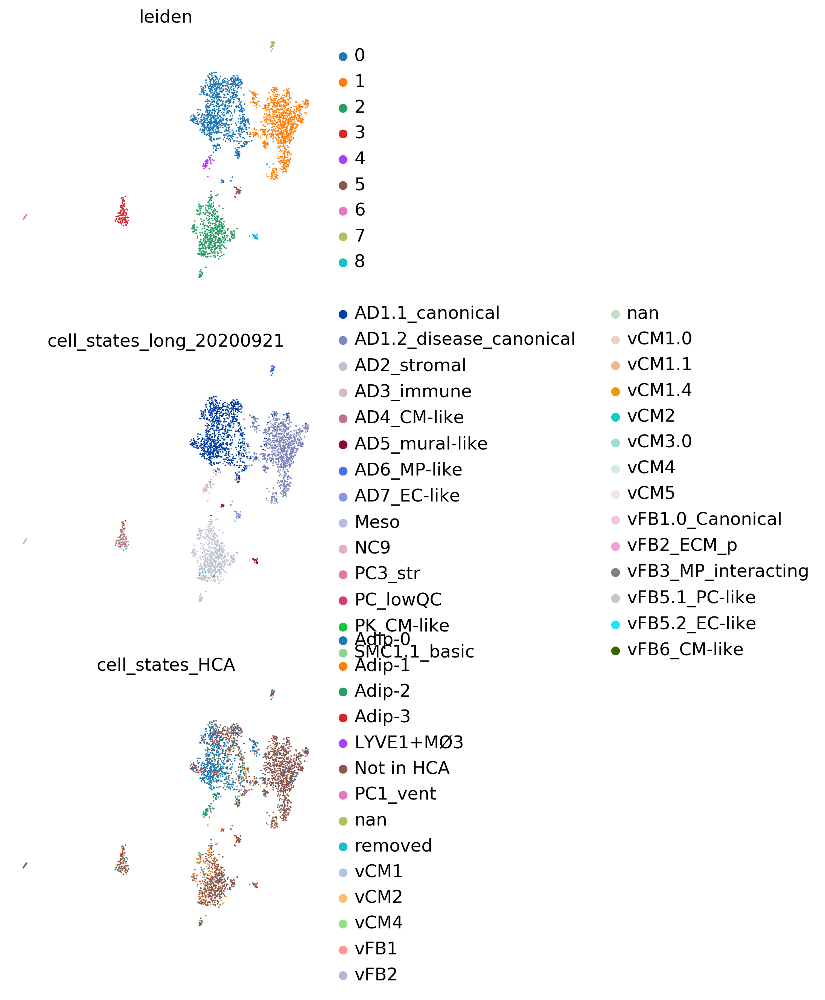

In [33]:
sc.pl.umap(adata_hvg, color = ['leiden', 'cell_states_long_20200921'
                               ,'cell_states_HCA'
                              ], size = 6, legend_fontsize = 14, frameon = False, ncols=1)

In [37]:
pd.DataFrame(adata_hvg.obs.cell_states_long_20200921.value_counts())

,cell_states_long_20200921
AD1.1_canonical,929
AD1.2_disease_canonical,918
AD2_stromal,548
nan,95
AD4_CM-like,73
AD3_immune,63
AD5_mural-like,41
AD7_EC-like,29
AD6_MP-like,24
Meso,20


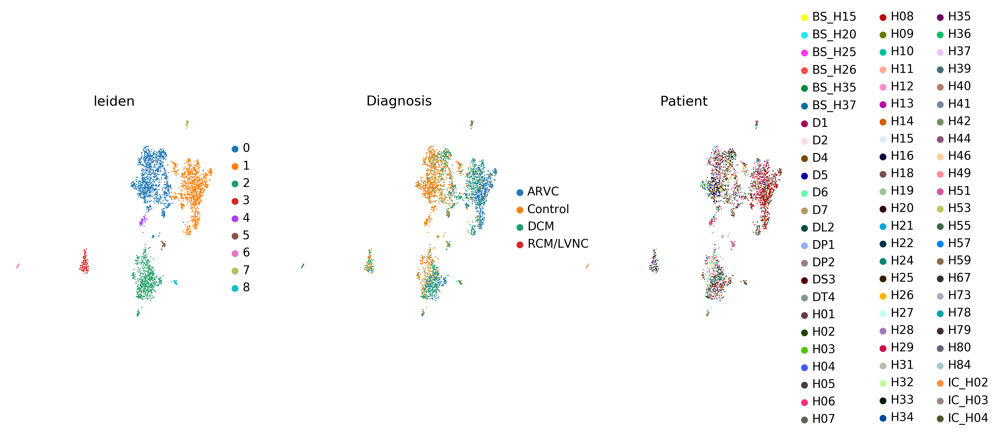

In [38]:
sc.pl.umap(adata_hvg, color = ['leiden', 'Diagnosis','Patient'], size = 6, legend_fontsize = 12, frameon = False)

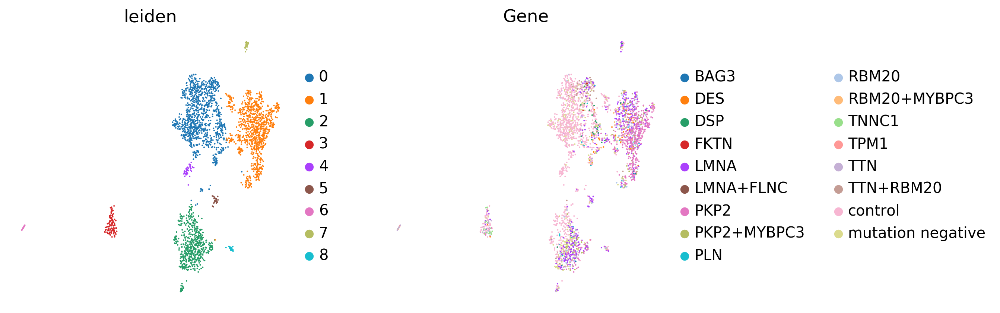

In [39]:
sc.pl.umap(adata_hvg, color = ['leiden', 'Gene'], size = 6, legend_fontsize = 12, frameon = False)

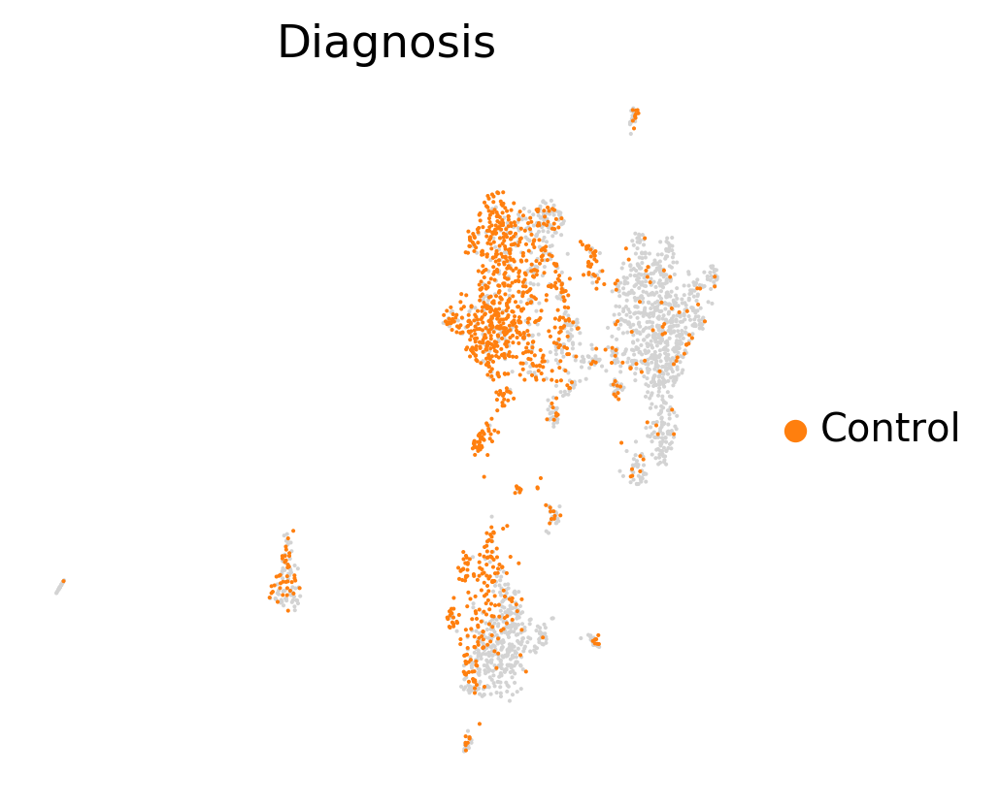

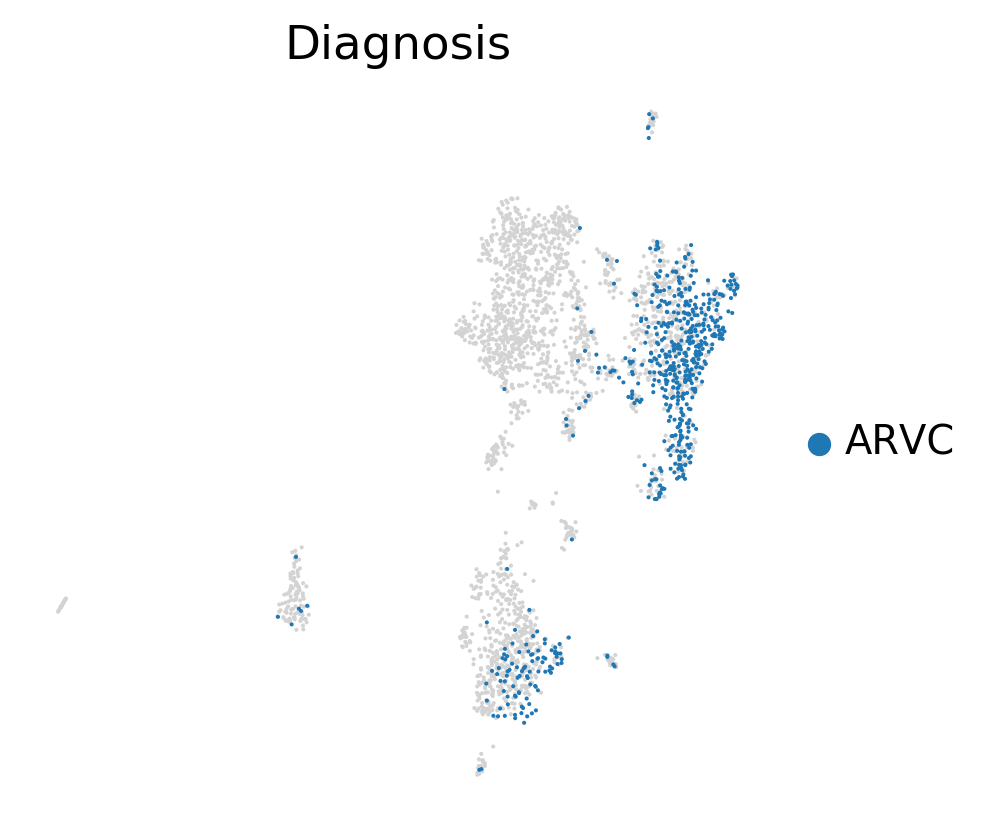

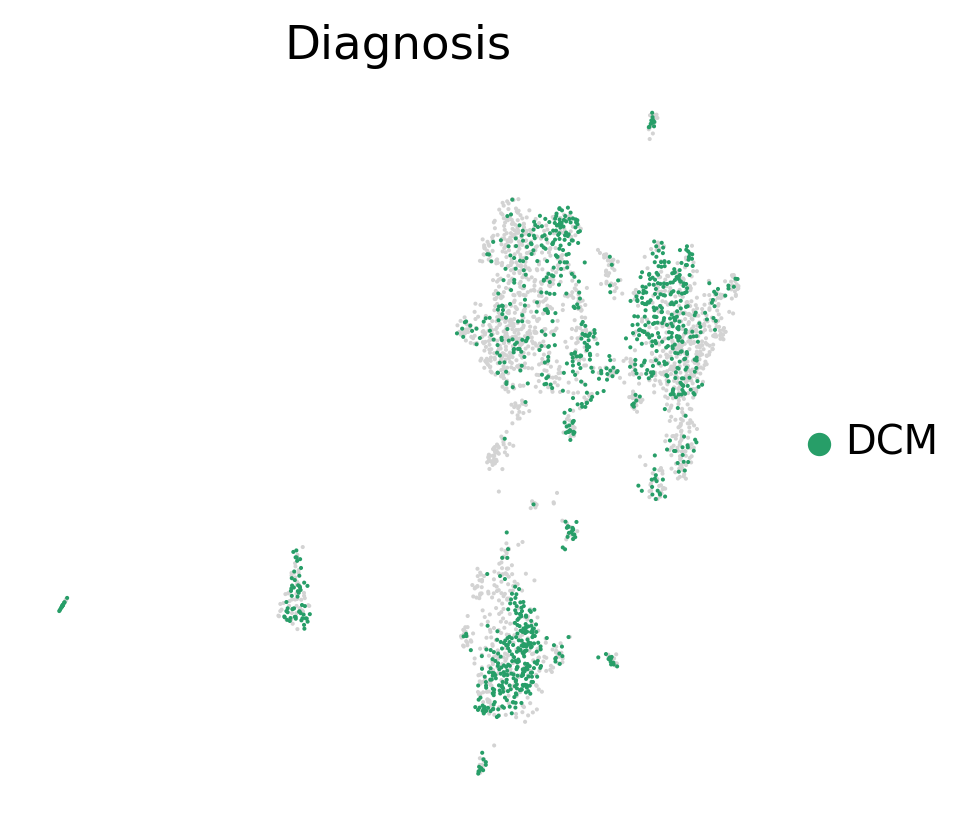

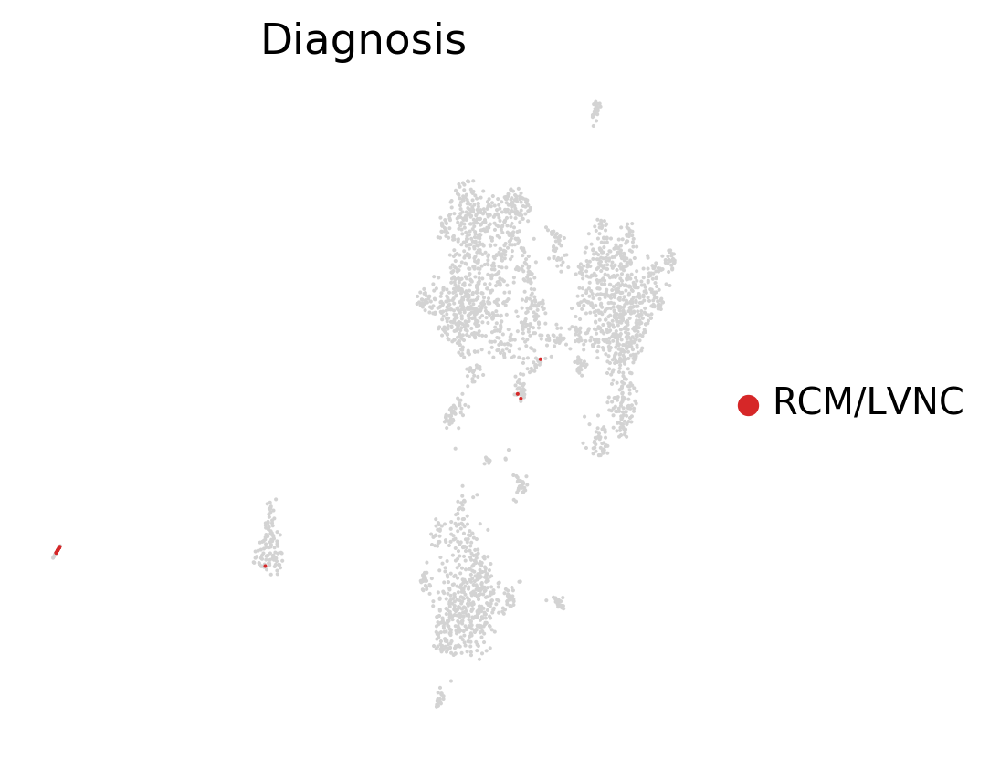

In [41]:
sc.pl.umap(adata_hvg, color = ['Diagnosis'],groups=['Control'], size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu')
sc.pl.umap(adata_hvg, color = ['Diagnosis'],groups=['ARVC'], size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu')
sc.pl.umap(adata_hvg, color = ['Diagnosis'],groups=['DCM'], size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu')
sc.pl.umap(adata_hvg, color = ['Diagnosis'],groups=['RCM/LVNC'], size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu')

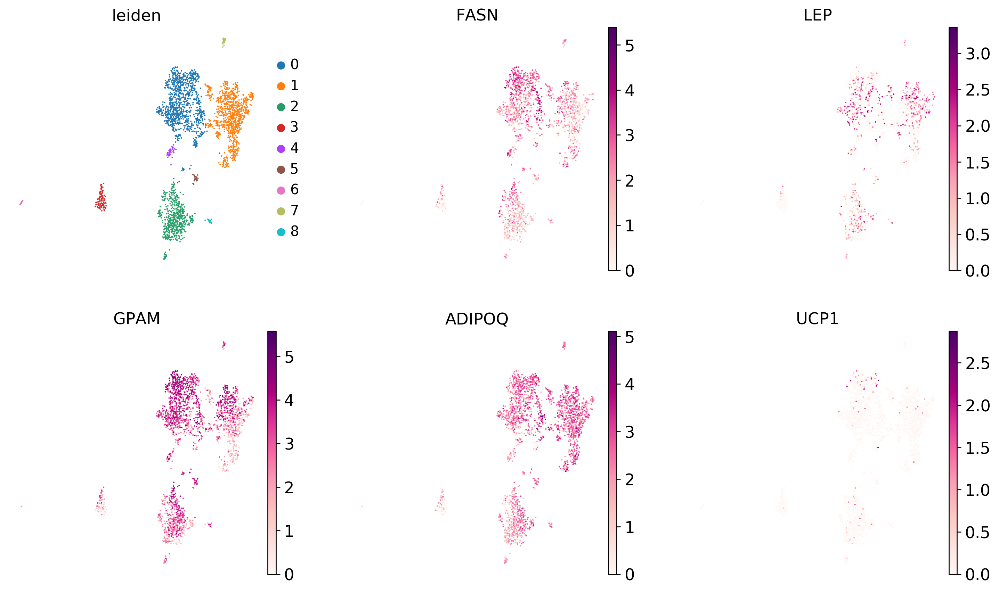

In [42]:
sc.pl.umap(adata_hvg, color = ['leiden', 'FASN','LEP', 'GPAM', 'ADIPOQ','UCP1'], size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu'
                               ,ncols=3
                               #, save='_leiden_-_Disease_adipocytes_ml200930_harmony_ml200930.pdf'
)

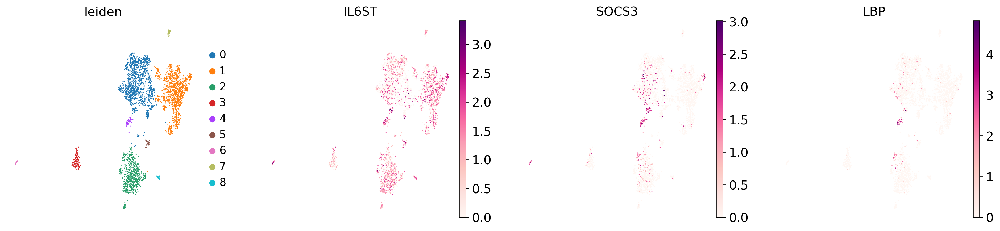

In [43]:
sc.pl.umap(adata_hvg, color = ['leiden', 'IL6ST','SOCS3','LBP'], size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu')

In [44]:
adata_hvg.shape

(2775, 5580)

In [45]:
pd.crosstab(adata_hvg.obs.leiden, adata_hvg.obs.Diagnosis)

Diagnosis,ARVC,Control,DCM,RCM/LVNC
leiden,,,,
0,14,712,312,3
1,470,106,347,0
2,93,197,279,0
3,6,40,54,1
4,0,42,1,0
5,1,9,18,0
6,0,1,14,9
7,5,9,10,0
8,4,7,11,0


In [46]:
pd.crosstab(adata_hvg.obs.leiden, adata_hvg.obs.Gene)

Gene,BAG3,DES,DSP,FKTN,LMNA,LMNA+FLNC,PKP2,PKP2+MYBPC3,PLN,RBM20,RBM20+MYBPC3,TNNC1,TPM1,TTN,TTN+RBM20,control,mutation negative
leiden,,,,,,,,,,,,,,,,,
0,0,11,19,2,48,1,12,1,6,9,5,1,3,14,61,712,136
1,3,33,4,0,167,0,406,55,13,58,9,1,0,24,6,106,38
2,2,1,2,0,119,0,45,38,7,20,0,0,0,26,5,197,107
3,0,3,0,0,9,0,5,1,0,1,0,18,1,20,1,40,2
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,42,1
5,0,0,0,0,13,0,0,1,0,1,0,0,0,0,0,9,4
6,0,3,0,0,0,0,0,0,0,0,0,2,9,8,0,1,1
7,0,0,1,0,7,0,2,1,0,0,0,0,0,0,0,9,4
8,0,0,0,0,6,0,4,0,0,1,0,0,0,3,0,7,1


In [47]:
pd.crosstab(adata_hvg.obs.leiden, adata_hvg.obs.Region)

Region,AP,FW,RV,S
leiden,,,,
0,380,168,460,33
1,62,99,661,101
2,80,73,338,78
3,12,24,36,29
4,30,4,9,0
5,2,6,17,3
6,8,5,4,7
7,6,3,13,2
8,9,1,11,1


In [48]:
pd.crosstab(adata_hvg.obs.leiden, adata_hvg.obs.Patient)

Patient,BS_H15,BS_H20,BS_H25,BS_H26,BS_H35,BS_H37,D1,D2,D4,D5,D6,D7,DL2,DP1,DP2,DS3,DT4,H01,H02,H03,H04,H05,H06,H07,H08,...,H34,H35,H36,H37,H39,H40,H41,H42,H44,H46,H49,H51,H53,H55,H57,H59,H67,H73,H78,H79,H80,H84,IC_H02,IC_H03,IC_H04
leiden,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,22,69,6,90,21,0,65,73,146,69,37,15,3,4,1,0,6,0,106,2,0,23,8,2,7,...,0,0,2,0,0,2,0,0,1,0,80,6,10,3,0,12,0,2,0,1,0,3,1,19,16
1,8,3,0,45,46,0,0,0,2,0,0,0,0,0,10,0,1,14,4,10,0,0,36,26,346,...,0,0,0,1,0,0,3,0,3,0,0,1,0,1,0,0,0,0,3,1,0,0,0,4,10
2,12,36,8,46,40,3,0,1,2,0,0,1,0,1,5,1,1,16,78,8,0,8,16,1,31,...,1,0,0,2,1,3,2,0,1,0,34,4,10,0,1,1,0,0,2,0,0,0,0,1,3
3,0,3,1,0,0,8,4,2,7,2,2,2,0,0,0,0,0,0,1,0,0,2,1,0,0,...,7,8,1,0,2,2,0,3,0,6,1,0,2,0,0,0,0,0,0,12,6,1,0,0,1
4,0,3,4,24,7,0,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,2,2,0,0,1,7,0,0,...,0,0,0,0,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,2,9,7,0,0
7,1,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,1,2,0,2,...,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,2,0,0,0,0,0,0,1,0
8,1,1,0,1,2,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,1,3,0,2,2,...,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [49]:
#pd.crosstab(adata_hvg.obs.leiden, adata_hvg.obs.Patient).to_csv('./Disease_adipocytes_ml200608_harmony_ml200611_-_leiden_vs_Patient.csv', sep = ',', index = False)

In [50]:
pd.crosstab(adata_hvg.obs.Patient, adata_hvg.obs.Gene)

Gene,BAG3,DES,DSP,FKTN,LMNA,LMNA+FLNC,PKP2,PKP2+MYBPC3,PLN,RBM20,RBM20+MYBPC3,TNNC1,TPM1,TTN,TTN+RBM20,control,mutation negative
Patient,,,,,,,,,,,,,,,,,
BS_H15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,44,0
BS_H20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,115,0
BS_H25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19,0
BS_H26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,206,0
BS_H35,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,121,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H80,0,0,0,0,0,0,0,0,0,0,0,8,0,0,0,0,0
H84,0,0,0,0,0,0,0,0,0,0,0,0,13,0,0,0,0
IC_H02,0,0,0,0,0,0,0,0,0,0,0,0,0,8,0,0,0


In [52]:
pd.crosstab(adata_hvg.obs.leiden, adata_hvg.obs.cell_states_long_20200921)

cell_states_long_20200921,AD1.1_canonical,AD1.2_disease_canonical,AD2_stromal,AD3_immune,AD4_CM-like,AD5_mural-like,AD6_MP-like,AD7_EC-like,Meso,NC9,PC3_str,PC_lowQC,PK_CM-like,SMC1.1_basic,nan,vCM1.0,vCM1.1,vCM1.4,vCM2,vCM3.0,vCM4,vCM5,vFB1.0_Canonical,vFB2_ECM_p,vFB3_MP_interacting,vFB5.1_PC-like,vFB5.2_EC-like,vFB6_CM-like
leiden,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,894,53,2,17,0,18,2,3,0,1,0,0,0,0,49,0,0,0,0,0,0,0,1,0,1,0,0,0
1,31,861,5,3,0,1,0,0,0,0,0,0,0,0,22,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,2,539,1,0,2,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,0,3,1,1,1,1,0
3,2,0,0,0,73,0,0,0,0,0,0,2,3,0,4,1,6,1,2,1,2,3,0,0,0,0,0,1
4,0,1,0,42,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,1,1,0,0,0,0,26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,3,0,0,20,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,22,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,1,0,0,17,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0


In [61]:
sc.tl.rank_genes_groups(adata_hvg, 'leiden'
                        , method = 'wilcoxon', n_genes = 0, use_raw = True)
markers = DEG_table(adata_hvg)

In [62]:
markers.head(20)

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,3_p,3_l,4_n,4_p,4_l,5_n,5_p,5_l,6_n,6_p,6_l,7_n,7_p,7_l,8_n,8_p,8_l
0,G0S2,7.03e-158,3.63,CPM,2.59e-214,2.81,DCN,3.33e-234,4.65,SORBS2,3.12e-58,6.53,MT2A,7.38e-19,4.96,ST6GALNAC3,1.77e-13,6.56,PKHD1L1,1.15e-11,9.58,ELMO1,6.59e-10,4.74,FRMD3,3.93e-07,5.58
1,NEAT1,4.15e-89,0.76,ZFAND5,7.27e-169,2.77,NEGR1,3.04e-232,4.67,TTN,3.12e-58,6.42,NAMPT,1.42e-18,3.92,VWF,2.73e-11,6.16,RBFOX1,7.78e-09,5.39,TBXAS1,6.59e-10,6.36,CALD1,5.29e-07,3.29
2,DLC1,1.08e-79,1.19,TNFAIP8,7.36e-162,2.54,CDH19,9.19e-229,5.64,MYBPC3,2.78e-57,6.27,GALNT2,3.45e-16,3.25,ANO2,2.07e-09,6.43,FLRT2,1.28e-07,6.34,RBPJ,2.69e-07,3.88,CACNA1C,1.63e-06,4.12
3,GPAM,1.33e-75,1.72,ZBTB16,6.43e-149,1.92,SCN7A,1.51e-225,5.80,RYR2,3.79e-57,6.64,OSMR,1.29e-15,4.80,PTPRB,2.07e-09,6.47,CACNB2,1.55e-07,4.03,DOCK2,5.59e-07,6.14,PLA2G5,2.89e-06,3.73
4,CARMN,5.77e-65,1.75,FKBP5,2.75e-139,2.38,LAMA2,5.95e-203,3.43,CTNNA3,5.81e-56,5.94,STAT3,1.29e-15,2.83,LDB2,1.03e-08,5.22,CUX1,1.97e-07,2.68,FMN1,8.21e-07,5.88,PRKG1,1.50e-05,3.31
5,AQP7,7.18e-64,1.00,PDK4,1.98e-129,2.77,ACSM3,1.39e-180,4.71,PALLD,5.81e-56,5.14,SLC1A3,2.69e-14,3.48,ID1,5.49e-08,4.36,KLF6,2.48e-07,3.59,IQGAP2,9.46e-07,5.24,AC012409.2,2.23e-04,4.53
6,DGAT2,4.09e-59,2.46,SLC19A3,1.29e-110,1.73,PRKG1,4.33e-177,3.64,NEBL,9.74e-55,5.85,ETV6,4.83e-14,3.43,GALNT18,2.89e-07,4.23,CD55,3.19e-07,5.23,RBM47,1.97e-06,4.50,EGFLAM,3.04e-04,4.40
7,MEST,1.31e-56,2.53,ACACB,3.44e-101,1.41,BICC1,3.13e-175,3.96,TNNT2,1.30e-54,5.21,CDC42EP4,4.83e-14,3.95,PLEKHG1,3.02e-07,4.99,KCNT2,3.19e-07,5.85,MS4A6A,2.16e-06,6.73,RCAN2,4.22e-04,4.25
8,MALAT1,3.19e-55,0.45,FOXO1,5.09e-100,1.38,ABCA8,4.43e-160,2.99,SLC8A1,1.44e-54,5.16,DDX21,7.88e-14,3.25,ELMO1,3.52e-07,3.59,C3,3.19e-07,5.30,MRC1,2.16e-06,6.54,RGS5,4.22e-04,5.48
9,HOOK2,2.01e-52,1.26,MAN1A1,3.74e-98,1.84,AKT3,5.60e-157,3.18,FHL2,2.27e-54,6.06,NFIL3,8.11e-14,4.10,FLT1,1.81e-06,5.38,SLC7A2,4.08e-07,7.45,F13A1,2.80e-06,6.47,DLC1,5.77e-04,1.86


In [63]:
sc.tl.dendrogram(adata_hvg, groupby='leiden')

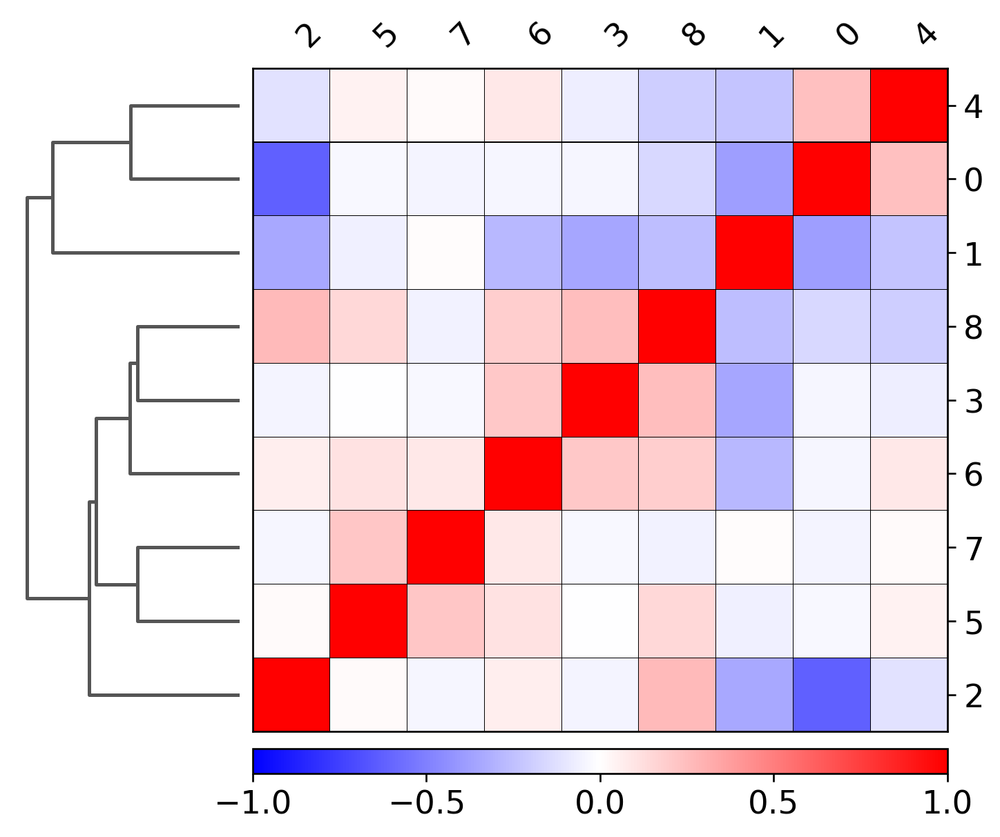

In [64]:
sc.pl.correlation_matrix(adata_hvg, groupby='leiden')

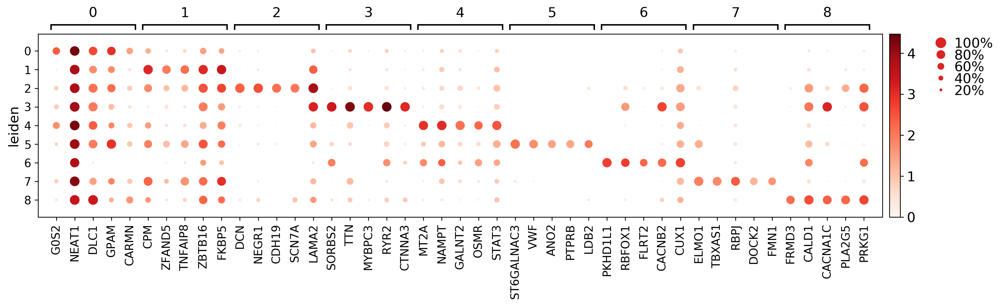

In [81]:
sc.pl.rank_genes_groups_dotplot(adata_hvg, key='rank_genes_groups', n_genes=5
                                ,use_raw=True
                                ,dendrogram=False
                                #,mean_only_expressed = True
                                #,save='_DEGs_hca_heart_global_ctl200422_wilcox.pdf'
)

In [66]:
markers_filtered = filtered_DEGs(adata_hvg)
markers_filtered.head(10)

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,3_p,3_l,4_n,4_p,4_l,5_n,5_p,5_l,6_n,6_p,6_l,7_n,7_p,7_l,8_n,8_p,8_l
0,G0S2,7.03e-158,3.63,CPM,2.59e-214,2.81,DCN,3.33e-234,4.65,SORBS2,3.12e-58,6.53,MT2A,7.38e-19,4.96,ST6GALNAC3,1.77e-13,6.56,PKHD1L1,1.15e-11,9.58,ELMO1,6.59e-10,4.74,FRMD3,3.93e-07,5.58
1,DLC1,1.08e-79,1.19,ZFAND5,7.27e-169,2.77,NEGR1,3.04e-232,4.67,TTN,3.12e-58,6.42,NAMPT,1.42e-18,3.92,VWF,2.73e-11,6.16,RBFOX1,7.78e-09,5.39,TBXAS1,6.59e-10,6.36,CALD1,5.29e-07,3.29
2,GPAM,1.33e-75,1.72,TNFAIP8,7.36e-162,2.54,CDH19,9.19e-229,5.64,MYBPC3,2.78e-57,6.27,GALNT2,3.45e-16,3.25,ANO2,2.07e-09,6.43,FLRT2,1.28e-07,6.34,RBPJ,2.69e-07,3.88,CACNA1C,1.63e-06,4.12
3,CARMN,5.77e-65,1.75,ZBTB16,6.43e-149,1.92,SCN7A,1.51e-225,5.80,RYR2,3.79e-57,6.64,OSMR,1.29e-15,4.80,PTPRB,2.07e-09,6.47,CACNB2,1.55e-07,4.03,DOCK2,5.59e-07,6.14,PLA2G5,2.89e-06,3.73
4,AQP7,7.18e-64,1.00,FKBP5,2.75e-139,2.38,LAMA2,5.95e-203,3.43,CTNNA3,5.81e-56,5.94,STAT3,1.29e-15,2.83,LDB2,1.03e-08,5.22,CUX1,1.97e-07,2.68,FMN1,8.21e-07,5.88,NaN,NaN,NaN
5,DGAT2,4.09e-59,2.46,PDK4,1.98e-129,2.77,ACSM3,1.39e-180,4.71,PALLD,5.81e-56,5.14,SLC1A3,2.69e-14,3.48,ID1,5.49e-08,4.36,KLF6,2.48e-07,3.59,IQGAP2,9.46e-07,5.24,NaN,NaN,NaN
6,MEST,1.31e-56,2.53,SLC19A3,1.29e-110,1.73,PRKG1,4.33e-177,3.64,NEBL,9.74e-55,5.85,ETV6,4.83e-14,3.43,GALNT18,2.89e-07,4.23,CD55,3.19e-07,5.23,RBM47,1.97e-06,4.50,NaN,NaN,NaN
7,HOOK2,2.01e-52,1.26,ACACB,3.44e-101,1.41,BICC1,3.13e-175,3.96,TNNT2,1.30e-54,5.21,CDC42EP4,4.83e-14,3.95,PLEKHG1,3.02e-07,4.99,KCNT2,3.19e-07,5.85,MS4A6A,2.16e-06,6.73,NaN,NaN,NaN
8,LAMA4,3.99e-49,1.26,FOXO1,5.09e-100,1.38,ABCA8,4.43e-160,2.99,SLC8A1,1.44e-54,5.16,DDX21,7.88e-14,3.25,ELMO1,3.52e-07,3.59,C3,3.19e-07,5.30,MRC1,2.16e-06,6.54,NaN,NaN,NaN
9,AGPAT2,5.24e-47,1.25,MAN1A1,3.74e-98,1.84,AKT3,5.60e-157,3.18,FHL2,2.27e-54,6.06,NFIL3,8.11e-14,4.10,FLT1,1.81e-06,5.38,SLC7A2,4.08e-07,7.45,F13A1,2.80e-06,6.47,NaN,NaN,NaN


In [67]:
markers_filtered_names = filtered_DEG_names(adata_hvg)
markers_filtered_names.head(10)

,0_n,1_n,2_n,3_n,4_n,5_n,6_n,7_n,8_n
0,G0S2,CPM,DCN,SORBS2,MT2A,ST6GALNAC3,PKHD1L1,ELMO1,FRMD3
1,DLC1,ZFAND5,NEGR1,TTN,NAMPT,VWF,RBFOX1,TBXAS1,CALD1
2,GPAM,TNFAIP8,CDH19,MYBPC3,GALNT2,ANO2,FLRT2,RBPJ,CACNA1C
3,CARMN,ZBTB16,SCN7A,RYR2,OSMR,PTPRB,CACNB2,DOCK2,PLA2G5
4,AQP7,FKBP5,LAMA2,CTNNA3,STAT3,LDB2,CUX1,FMN1,NaN
5,DGAT2,PDK4,ACSM3,PALLD,SLC1A3,ID1,KLF6,IQGAP2,NaN
6,MEST,SLC19A3,PRKG1,NEBL,ETV6,GALNT18,CD55,RBM47,NaN
7,HOOK2,ACACB,BICC1,TNNT2,CDC42EP4,PLEKHG1,KCNT2,MS4A6A,NaN
8,LAMA4,FOXO1,ABCA8,SLC8A1,DDX21,ELMO1,C3,MRC1,NaN
9,AGPAT2,MAN1A1,AKT3,FHL2,NFIL3,FLT1,SLC7A2,F13A1,NaN


In [68]:
markers.to_csv('./AD_20210305_V1_harmony_ml20210308_wilcox_500_unfiltered.csv', sep = ',', index = False)
markers_filtered.to_csv('./AD_20210305_V1_harmony_ml20210308_wilcox_500.csv', sep = ',', index = False)
markers_filtered_names.transpose().to_csv('./AD_20210305_V1_harmony_ml20210308_wilcox_500_names.csv', sep = ',', index = True, header=False)

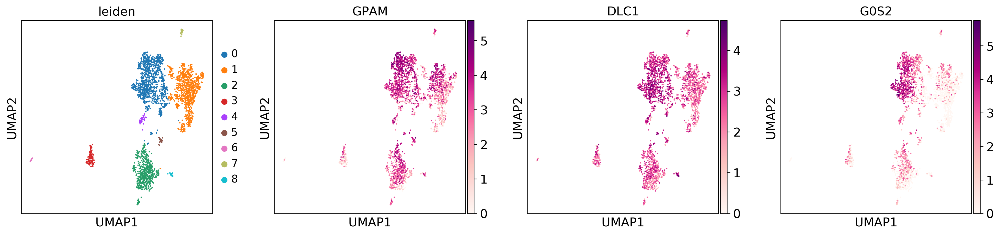

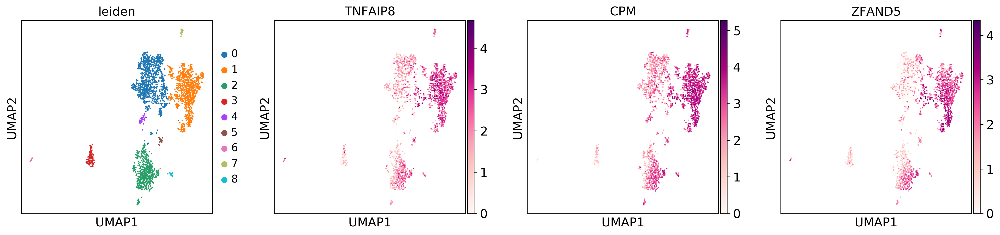

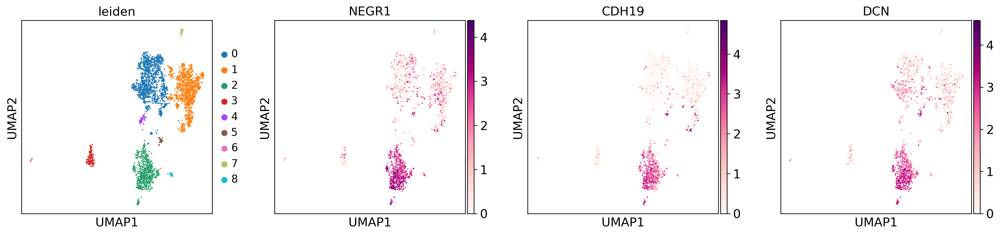

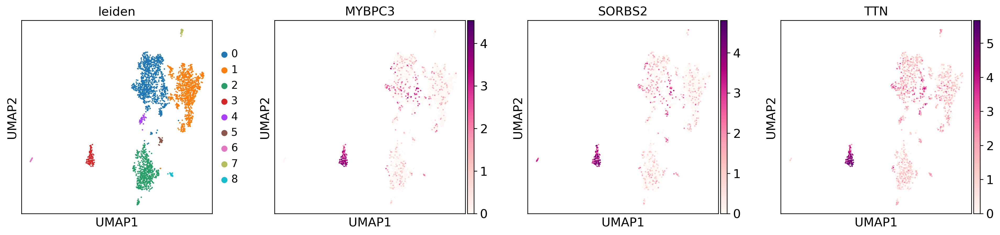

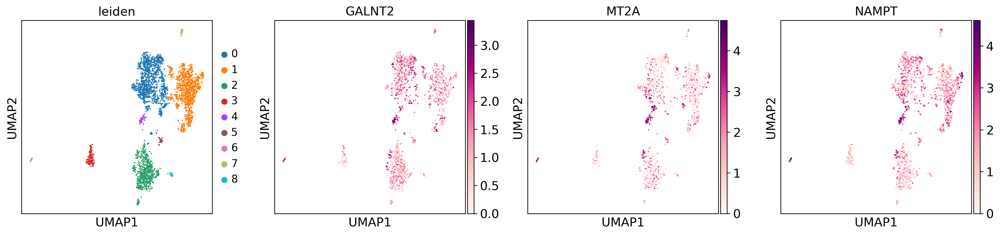

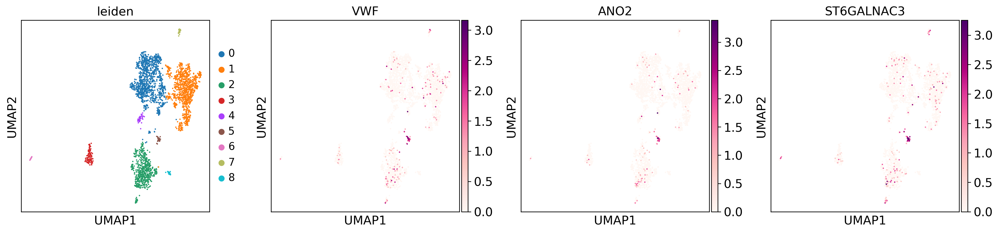

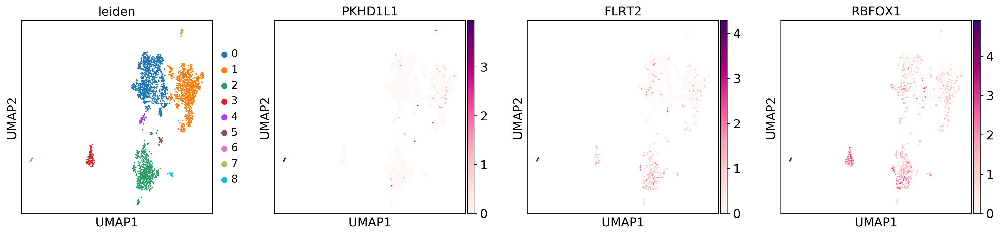

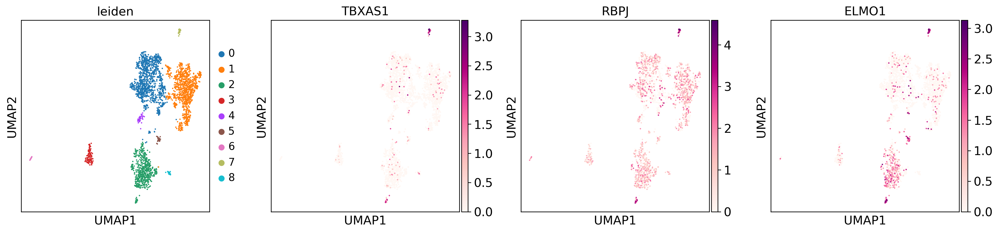

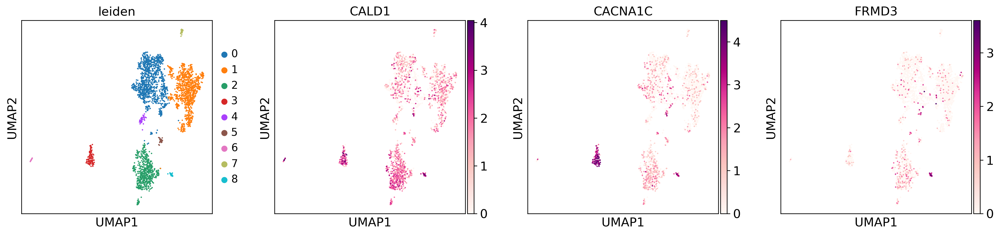

In [69]:
markers_nuclei_df = pd.DataFrame(markers_filtered_names).head(3)
for i in markers_nuclei_df.columns:
    temp = {x for x in markers_nuclei_df[i] if x==x}
    if len(temp)>0:
        ax = sc.pl.umap(adata_hvg, color = ['leiden']+list(temp), size = 10, legend_fontsize = 12, color_map = 'RdPu', use_raw=True)

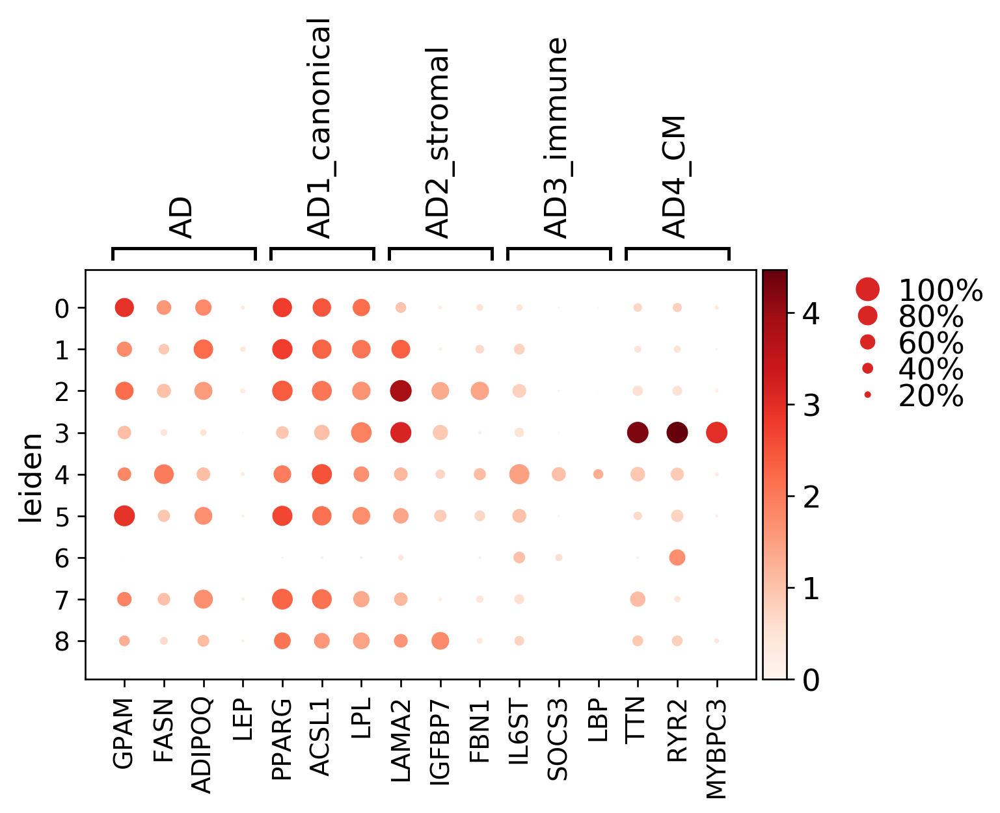

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[5.6, 0, 0.2, 0.5, 0.25])

In [76]:
sc.pl.dotplot(adata_hvg, var_names = {'AD':['GPAM','FASN','ADIPOQ','LEP'],
                                      'AD1_canonical':['PPARG','ACSL1','LPL'],
                                      'AD2_stromal':['LAMA2','IGFBP7','FBN1'],
                                      'AD3_immune':['IL6ST','SOCS3','LBP'],
                                      'AD4_CM':['TTN','RYR2','MYBPC3']}
                                            , groupby='leiden', use_raw=True, dendrogram=False
              #, save='_select_genes_Adip_markers_heart_adipocytes_scGen_global_ct200422_ml200530_raw.pdf'
             )

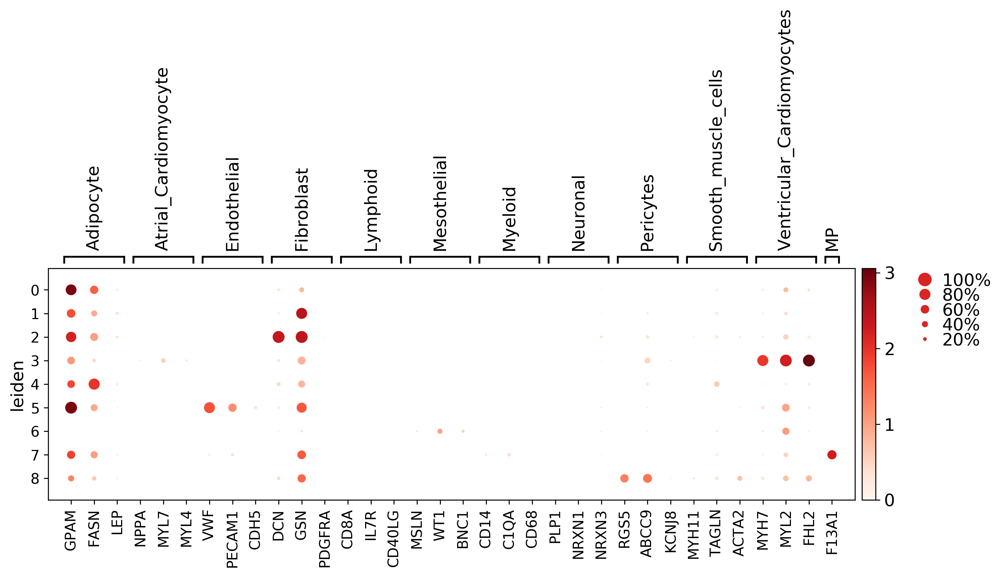

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[11.899999999999999, 0, 0.2, 0.5, 0.25])

In [71]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN', 'LEP'],
                     'Atrial_Cardiomyocyte': ['NPPA', 'MYL7', 'MYL4'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Mesothelial': ['MSLN', 'WT1', 'BNC1'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2'],
                     'MP':['F13A1']}

#sc.pl.dotplot(adata, var_names=['GPAM', 'FASN', 'LEP', 'NPPA', 'MYL7', 'MYL4', 'VWF', 'PECAM1', 'CDH5', 'DCN', 'GSN', 'PDGFRA', 'CD8A', 'IL7R', 'CD40LG', 'MSLN', 'WT1', 'BNC1', 'CD14', 'C1QA', 'CD68', 'PLP1', 'NRXN1', 'NRXN3', 'RGS5', 'ABCC9', 'KCNJ8', 'MYH11', 'TAGLN', 'ACTA2', 'MYH7', 'MYL2', 'FHL2'], groupby='leiden'
sc.pl.dotplot(adata_hvg, var_names=marker_genes_dict, groupby='leiden'
                ,use_raw=True
                                #,mean_only_expressed = True
                                #,save='_DEGs_hca_heart_global_ctl200422_wilcox.pdf'
)

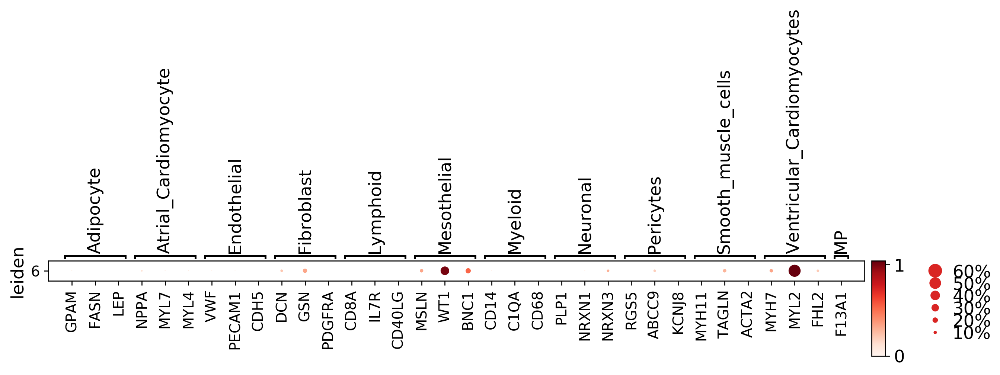

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[11.899999999999999, 0, 0.2, 0.5, 0.25])

In [80]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN', 'LEP'],
                     'Atrial_Cardiomyocyte': ['NPPA', 'MYL7', 'MYL4'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Mesothelial': ['MSLN', 'WT1', 'BNC1'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2'],
                     'MP':['F13A1']}

#sc.pl.dotplot(adata, var_names=['GPAM', 'FASN', 'LEP', 'NPPA', 'MYL7', 'MYL4', 'VWF', 'PECAM1', 'CDH5', 'DCN', 'GSN', 'PDGFRA', 'CD8A', 'IL7R', 'CD40LG', 'MSLN', 'WT1', 'BNC1', 'CD14', 'C1QA', 'CD68', 'PLP1', 'NRXN1', 'NRXN3', 'RGS5', 'ABCC9', 'KCNJ8', 'MYH11', 'TAGLN', 'ACTA2', 'MYH7', 'MYL2', 'FHL2'], groupby='leiden'
sc.pl.dotplot(adata_hvg[adata_hvg.obs.leiden == '6'], var_names=marker_genes_dict, groupby='leiden'
                ,use_raw=True
                                #,mean_only_expressed = True
                                #,save='_DEGs_hca_heart_global_ctl200422_wilcox.pdf'
)

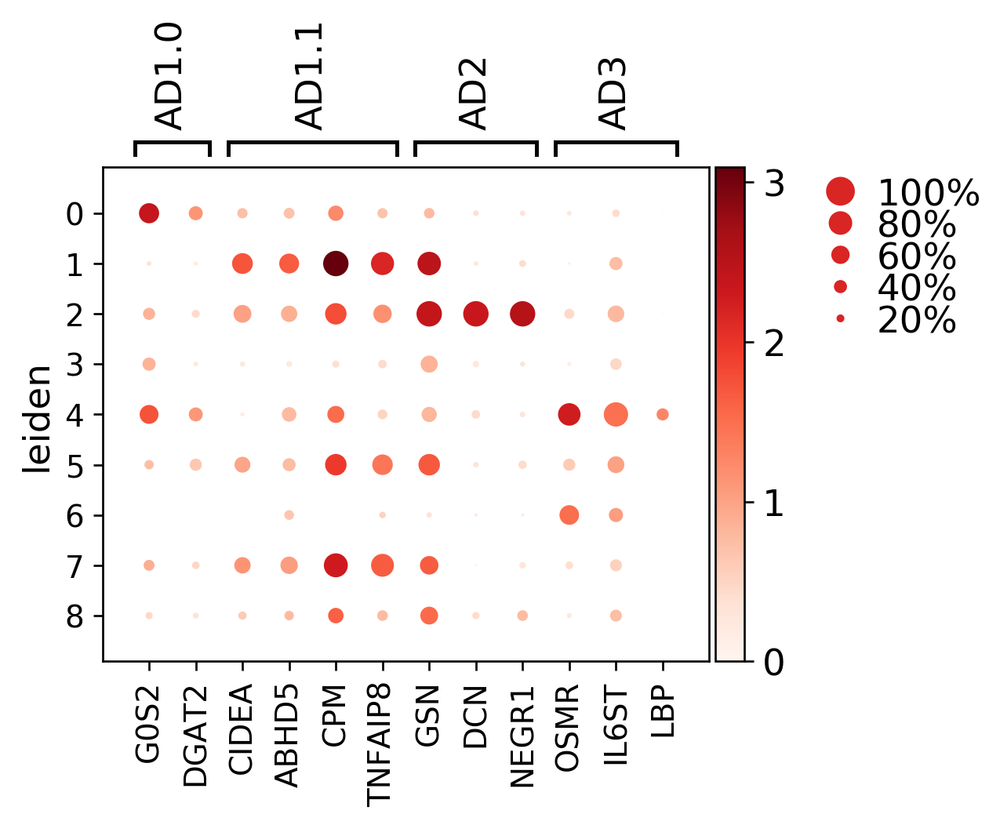

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[4.199999999999999, 0, 0.2, 0.5, 0.25])

In [79]:
sc.pl.dotplot(adata_hvg, var_names = {'AD1.0':['G0S2','DGAT2'],
                                      'AD1.1':['CIDEA','ABHD5','CPM','TNFAIP8'],
                                      'AD2':['GSN','DCN','NEGR1'],
                                      'AD3':['OSMR','IL6ST','LBP']
                                     }
                                            , groupby='leiden', use_raw=True, dendrogram=False
              #, save='_select_genes_Adip_markers_heart_adipocytes_scGen_global_ct200422_ml200530_raw.pdf'
             )

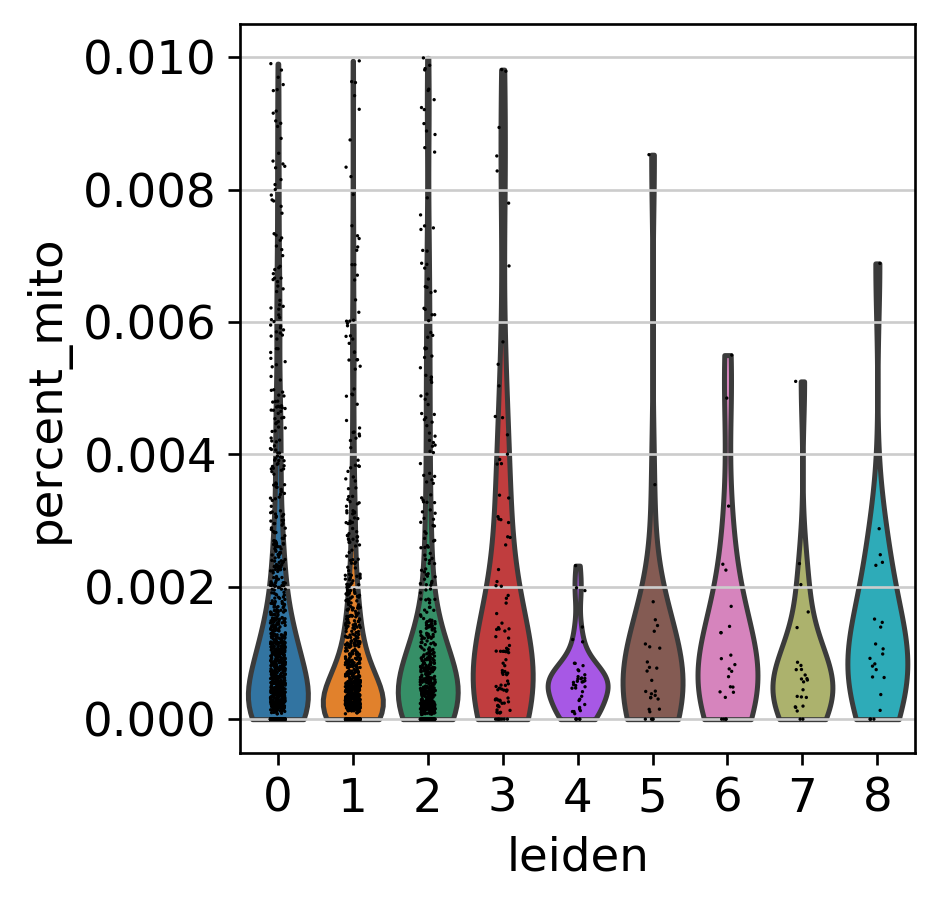

In [72]:
sc.pl.violin(adata_hvg, ['percent_mito'], groupby='leiden',
             jitter=0.1, multi_panel=True)

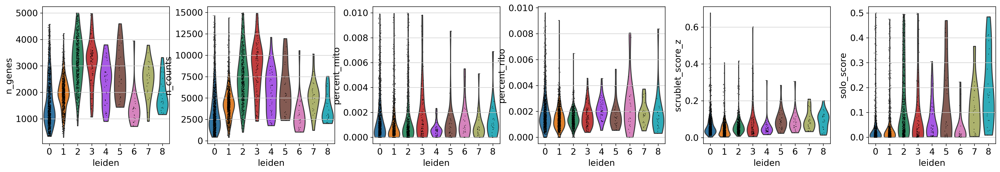

In [73]:
sc.pl.violin(adata_hvg, ['n_genes', 'n_counts', 'percent_mito','percent_ribo', 'scrublet_score_z','solo_score'], groupby='leiden',
             jitter=0.1, multi_panel=True)

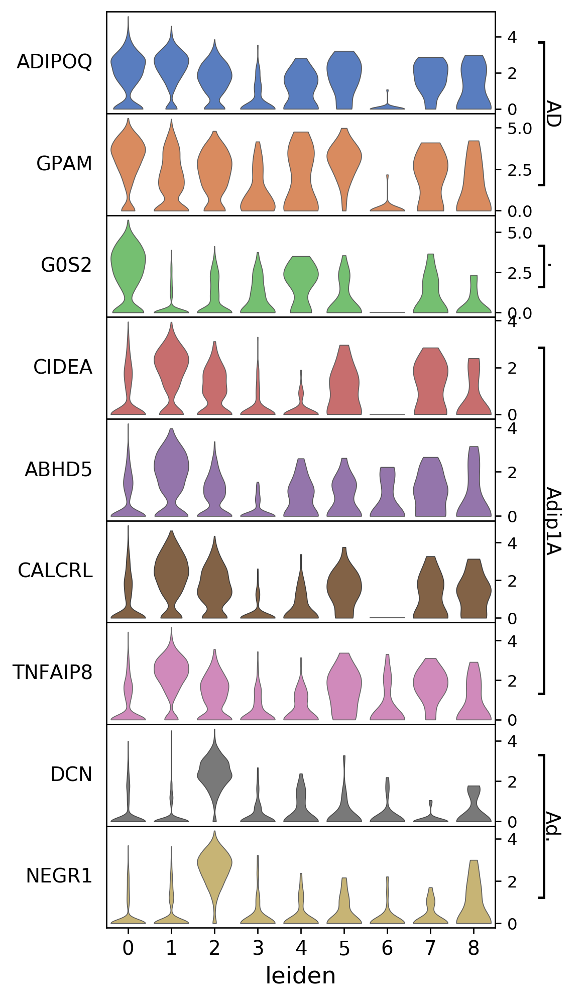

In [75]:
sc.pl.stacked_violin(adata_hvg, var_names = {
               'AD':['ADIPOQ','GPAM'],
               'Adip1':['G0S2'],
               'Adip1A':['CIDEA','ABHD5','CALCRL','TNFAIP8'],
               'Adip2':['DCN','NEGR1']
           }
                                            , groupby='leiden', use_raw=True, dendrogram=False
                     , swap_axes=True
                     , figsize = [5,10]
              #, save='_select_genes_Adip_markers_heart_adipocytes_scGen_global_ct200422_ml200530_raw.pdf'
             )

In [78]:
adata_hvg.obs['leiden'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8'], dtype='object')

In [82]:
adata_hvg.obs['cell_states'] = adata_hvg.obs['leiden']
adata_hvg.obs['cell_states'].cat.categories = [
                                                'AD1.0',
                                                'AD1.1',
                                                'AD2',
                                                'AD0.1',
                                                'AD3',
                                                'AD0.2',
                                                'AD0.3',
                                                'AD0.4',
                                                'AD0.5'
                                            ]
adata_hvg.obs['cell_states_long'] = adata_hvg.obs['leiden']
adata_hvg.obs['cell_states_long'].cat.categories = [
                                                'AD1.0_canonical',
                                                'AD1.1_disease_canonical',
                                                'AD2_stromal',
                                                'AD0.1_CM-like',
                                                'AD3_immune',
                                                'AD0.2_EC-like',
                                                'AD0.3_Meso',
                                                'AD0.4_MP-like',
                                                'AD0.5_PC-like'
                                            ]

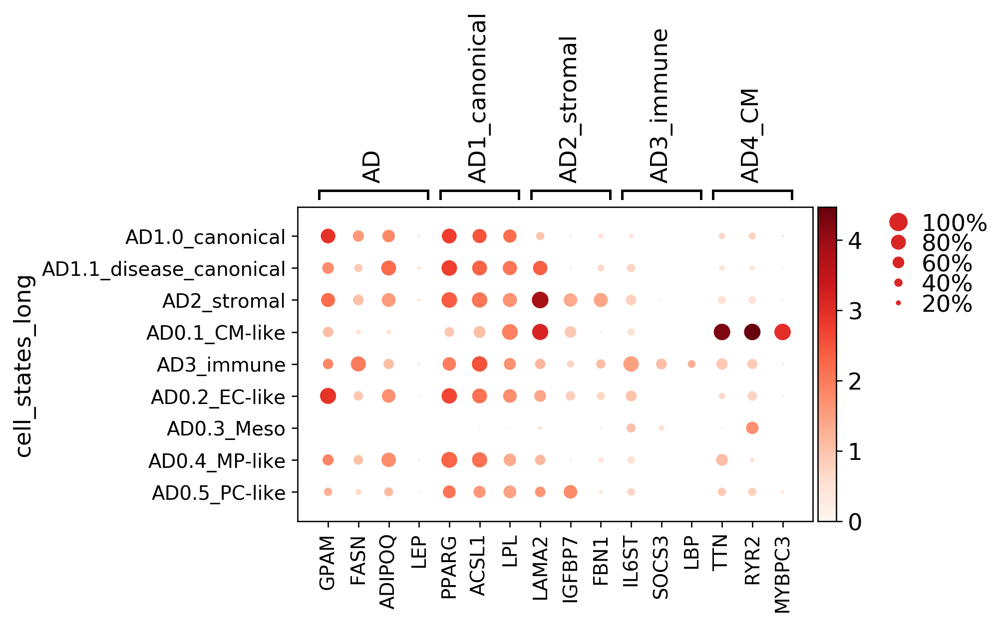

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[5.6, 0, 0.2, 0.5, 0.25])

In [83]:
sc.pl.dotplot(adata_hvg, var_names = {'AD':['GPAM','FASN','ADIPOQ','LEP'],
                                      'AD1_canonical':['PPARG','ACSL1','LPL'],
                                      'AD2_stromal':['LAMA2','IGFBP7','FBN1'],
                                      'AD3_immune':['IL6ST','SOCS3','LBP'],
                                      'AD4_CM':['TTN','RYR2','MYBPC3']}
                                            , groupby='cell_states_long', use_raw=True, dendrogram=False
              #, save='_select_genes_Adip_markers_heart_adipocytes_scGen_global_ct200422_ml200530_raw.pdf'
             )

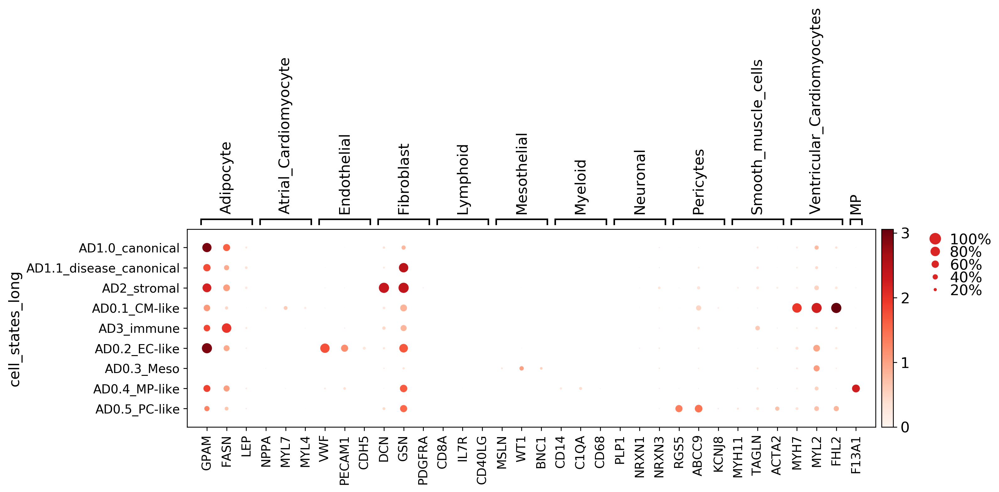

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[11.899999999999999, 0, 0.2, 0.5, 0.25])

In [84]:
marker_genes_dict = {'Adipocyte': ['GPAM', 'FASN', 'LEP'],
                     'Atrial_Cardiomyocyte': ['NPPA', 'MYL7', 'MYL4'],
                     'Endothelial': ['VWF', 'PECAM1', 'CDH5'],
                     'Fibroblast': ['DCN', 'GSN', 'PDGFRA'],
                     'Lymphoid': ['CD8A', 'IL7R', 'CD40LG'],
                     'Mesothelial': ['MSLN', 'WT1', 'BNC1'],
                     'Myeloid': ['CD14', 'C1QA', 'CD68'],
                     'Neuronal': ['PLP1', 'NRXN1', 'NRXN3'],
                     'Pericytes': ['RGS5', 'ABCC9', 'KCNJ8' ],
                     'Smooth_muscle_cells': ['MYH11', 'TAGLN', 'ACTA2'],
                     'Ventricular_Cardiomyocytes': ['MYH7', 'MYL2', 'FHL2'],
                     'MP':['F13A1']}

#sc.pl.dotplot(adata, var_names=['GPAM', 'FASN', 'LEP', 'NPPA', 'MYL7', 'MYL4', 'VWF', 'PECAM1', 'CDH5', 'DCN', 'GSN', 'PDGFRA', 'CD8A', 'IL7R', 'CD40LG', 'MSLN', 'WT1', 'BNC1', 'CD14', 'C1QA', 'CD68', 'PLP1', 'NRXN1', 'NRXN3', 'RGS5', 'ABCC9', 'KCNJ8', 'MYH11', 'TAGLN', 'ACTA2', 'MYH7', 'MYL2', 'FHL2'], groupby='leiden'
sc.pl.dotplot(adata_hvg, var_names=marker_genes_dict, groupby='cell_states_long'
                ,use_raw=True
                                #,mean_only_expressed = True
                                #,save='_DEGs_hca_heart_global_ctl200422_wilcox.pdf'
)

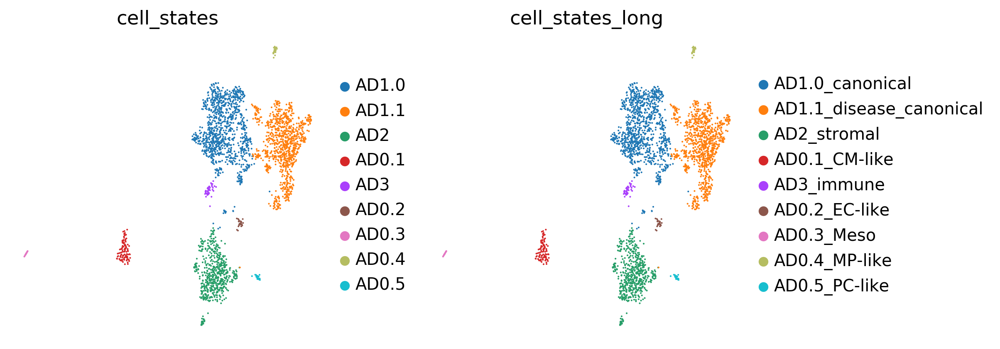

In [85]:
sc.pl.umap(adata_hvg
           , color =[
               'cell_states','cell_states_long'
           ]
           , size = 6, legend_fontsize = 12, frameon = False, use_raw=True, color_map = 'RdPu', ncols=2)

In [117]:
adata_out = adata_hvg.copy()
adata_out.raw = adata_orig.copy()
adata_out.obs = adata_out.obs.loc[:,~adata_out.obs.columns.str.startswith('leiden_0')]
adata_out.write("./AD_20210305_V1_annotated_with_doublets_ml20210308.h5ad")
adata_out.obs.to_csv("./AD_20210305_V1_META_DOUBLETS.csv")

In [118]:
print('.X.max: ' + str(adata_out.X.max()))
print('.raw.X.max: ' + str(adata_out.raw.X.max()))

.X.max: 6.519711
.raw.X.max: 4660.0


In [119]:
adata_out2 = anndata.AnnData(X=adata_out.raw.X, obsm=adata_out.obsm, obs=adata_out.obs, var=adata_out.raw.var)
adata_out2 = adata_out2[~adata_out2.obs.cell_states.str.startswith('AD0.')]
adata_out2.write("./AD_20210305_V1_RAW_doublets_removed_ml20210308.h5ad")

In [120]:
print('.X.max: ' + str(adata_out2.X.max()))
print('.raw.X.max: ' + str(adata_out2.raw.X.max()))

.X.max: 4660.0


AttributeError: 'NoneType' object has no attribute 'X'

In [103]:
adata_out2.obs.cell_states_long.value_counts()

AD1.0_canonical            1041
AD1.1_disease_canonical     923
AD2_stromal                 569
AD3_immune                   43
Name: cell_states_long, dtype: int64

In [105]:
temp = pd.DataFrame(adata_hvg.obs, columns = ['cell_states_long'])
for gene in ['ADIPOQ','FASN','LEP','GPAM','UCP1','ACACB','LPIN1','G0S2','CIDEA']:
    temp[gene] = list(pd.DataFrame.sparse.from_spmatrix(adata_hvg.raw.X[:,adata_hvg.raw.var.index == gene])[0])
    temp[gene+'_expr'] = temp[gene]>0
result=temp.groupby('cell_states_long').mean()
result

,ADIPOQ,ADIPOQ_expr,FASN,FASN_expr,LEP,LEP_expr,GPAM,GPAM_expr,UCP1,UCP1_expr,ACACB,ACACB_expr,LPIN1,LPIN1_expr,G0S2,G0S2_expr,CIDEA,CIDEA_expr
cell_states_long,,,,,,,,,,,,,,,,,,
AD1.0_canonical,1.80,0.75,1.61,0.68,0.30,0.18,2.94,0.88,4.60e-02,3.36e-02,3.50,0.93,1.16,0.56,2.38,0.77,0.73,0.39
AD1.1_disease_canonical,2.22,0.90,0.92,0.50,0.37,0.25,1.78,0.70,1.16e-02,9.75e-03,4.32,0.99,1.21,0.63,0.34,0.18,1.73,0.80
AD2_stromal,1.55,0.83,1.04,0.65,0.27,0.23,2.19,0.84,3.04e-02,3.16e-02,3.51,0.99,1.05,0.69,0.85,0.46,1.02,0.68
AD0.1_CM-like,0.45,0.30,0.47,0.31,0.06,0.06,1.08,0.62,5.09e-03,9.90e-03,2.23,0.96,0.73,0.58,0.85,0.50,0.26,0.20
AD3_immune,1.07,0.63,1.98,0.91,0.26,0.19,1.82,0.63,0.00e+00,0.00e+00,2.59,0.86,2.00,0.79,1.75,0.72,0.17,0.16
AD0.2_EC-like,1.70,0.82,0.94,0.57,0.18,0.14,2.92,0.96,0.00e+00,0.00e+00,3.90,0.96,0.94,0.64,0.74,0.36,0.99,0.61
AD0.3_Meso,0.04,0.04,0.00,0.00,0.00,0.00,0.09,0.04,0.00e+00,0.00e+00,0.19,0.12,0.13,0.08,0.00,0.00,0.00,0.00
AD0.4_MP-like,1.72,0.88,1.04,0.58,0.19,0.17,1.87,0.67,0.00e+00,0.00e+00,3.36,0.96,0.73,0.42,0.90,0.42,1.14,0.62
AD0.5_PC-like,1.11,0.55,0.64,0.36,0.20,0.14,1.29,0.50,0.00e+00,0.00e+00,3.06,0.91,0.82,0.45,0.46,0.27,0.61,0.32


In [106]:
result.ADIPOQ/result.ADIPOQ_expr

cell_states_long
AD1.0_canonical            2.39
AD1.1_disease_canonical    2.46
AD2_stromal                1.86
AD0.1_CM-like              1.51
AD3_immune                 1.71
AD0.2_EC-like              2.08
AD0.3_Meso                 1.06
AD0.4_MP-like              1.96
AD0.5_PC-like              2.04
dtype: float64

In [107]:
adata_hvg.obs.cell_states_long.value_counts()/np.sum(adata_hvg.obs.cell_states_long.value_counts())

AD1.0_canonical            3.75e-01
AD1.1_disease_canonical    3.33e-01
AD2_stromal                2.05e-01
AD0.1_CM-like              3.64e-02
AD3_immune                 1.55e-02
AD0.2_EC-like              1.01e-02
AD0.4_MP-like              8.65e-03
AD0.3_Meso                 8.65e-03
AD0.5_PC-like              7.93e-03
Name: cell_states_long, dtype: float64

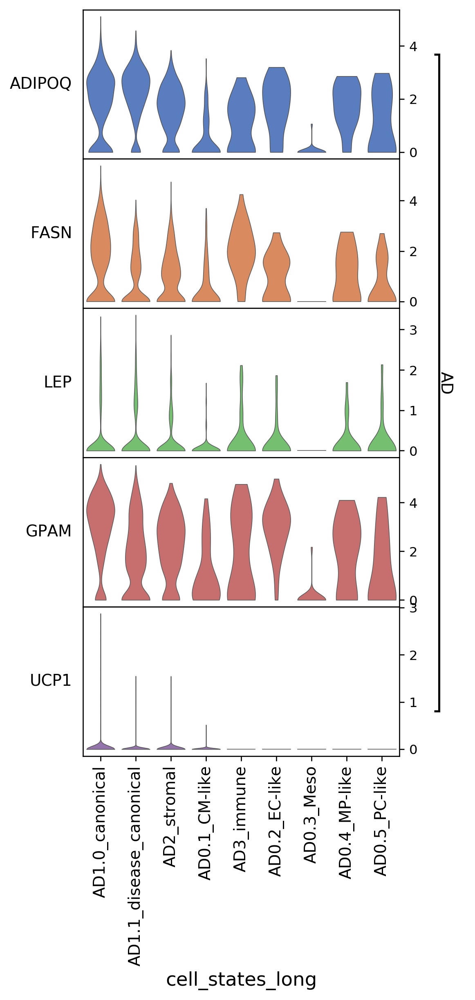

In [108]:
sc.pl.stacked_violin(adata_hvg, var_names = {
               'AD':['ADIPOQ','FASN','LEP','GPAM','UCP1']
           }
                                            , groupby='cell_states_long', use_raw=True, dendrogram=False
                     , swap_axes=True
                     , figsize = [5,10]
              #, save='_select_genes_Adip_markers_heart_adipocytes_scGen_global_ct200422_ml200530_raw.pdf'
             )

In [109]:
sc.tl.rank_genes_groups(adata_hvg, 'cell_states_long'
                        #, groups=['Adip-0','Adip-1','Adip-2','Adip-3']
                        #,rankby_abs=True
                        #,reference = '2'
                        , method = 'wilcoxon', n_genes = 0, use_raw = True)
markers = DEG_table(adata_hvg)

In [110]:
markers_filtered = filtered_DEGs(adata_hvg)
markers_filtered_names = filtered_DEG_names(adata_hvg)
markers.to_csv('./AD_20210305_V1_annotated_with_doublets_ml20210308_wilcox_500_unfiltered_cell_states_long.csv', sep = ',', index = False)
markers_filtered.to_csv('./AD_20210305_V1_annotated_with_doublets_ml20210308_wilcox_500_cell_states_long.csv', sep = ',', index = False)
markers_filtered_names.transpose().to_csv('./AD_20210305_V1_annotated_with_doublets_ml20210308_wilcox_500_names_cell_states_long.csv', sep = ',', index = True, header=False)

In [111]:
sc.tl.rank_genes_groups(adata_hvg, 'cell_states_long'
                        #, groups=['Adip-0','Adip-1','Adip-2','Adip-3']
                        ,rankby_abs=True
                        #,reference = '2'
                        , method = 'wilcoxon', n_genes = 500, use_raw = True)
markers = DEG_table(adata_hvg)

In [112]:
markers_filtered = filtered_down_reg_DEGs(adata_hvg)
markers_filtered_names = filtered_down_reg_DEG_names(adata_hvg)
markers_filtered.to_csv('./AD_20210305_V1_annotated_with_doublets_ml20210308_wilcox_abs_500_cell_states_long.csv', sep = ',', index = False)
markers_filtered_names.transpose().to_csv('./AD_20210305_V1_annotated_with_doublets_ml20210308_wilcox_abs_500_names_cell_states_long.csv', sep = ',', index = True, header=False)

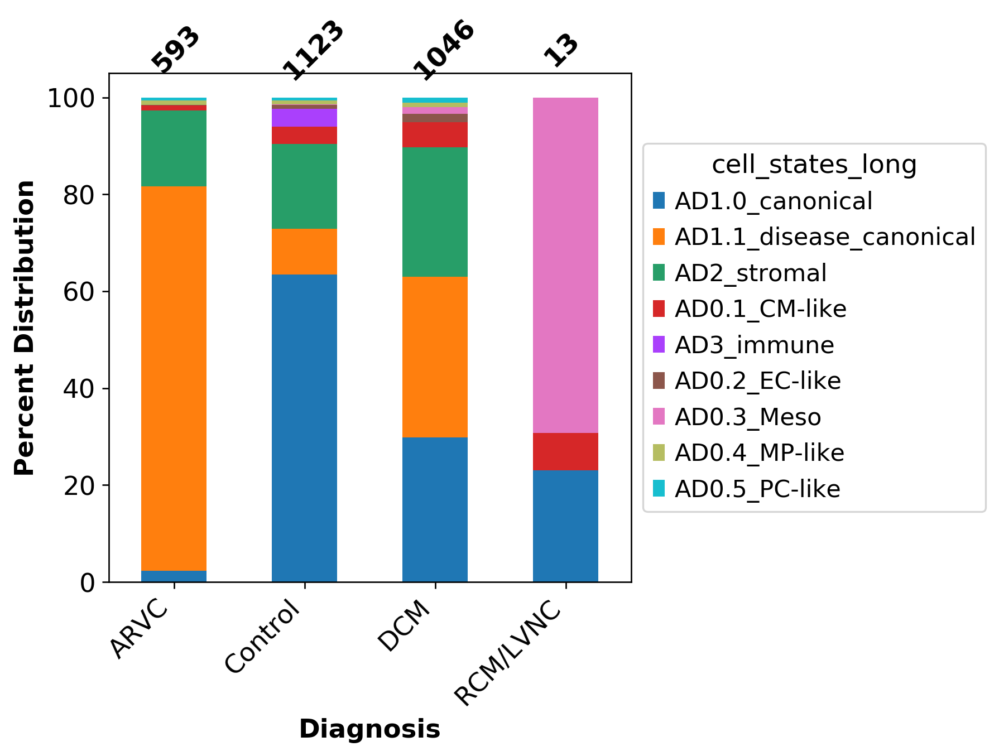

In [113]:
stacked_barplot(adata_hvg, 'Diagnosis', 'cell_states_long', 'Diagnosis', 'cell_states_long', shift_top=0.2, xaxis_rotation=45, figsize=(5,5), percent=False)